In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # For creating plots
import matplotlib.ticker as mtick # For specifying the axes tick format 
import matplotlib.pyplot as plt
%matplotlib inline


#Let's make this notebook reproducible, you can use any number ex = 42
np.random.seed(42)


# set plot style for all plots
plt.style.use('ggplot')
%matplotlib inline


# https://www.webucator.com/blog/2015/03/python-color-constants-module/

In [2]:
import glob
import pandas as pd
import os
import numpy as np
import pickle
import sys



In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pylab import figure, text, scatter, show

def plot_results(file):
    df_orig = pd.read_csv(file, sep=';')
    df_orig.drop_duplicates(inplace=True)
    datasets = ['bpic2017_C', 'sepsis_1', 'bpic2012_A', 'bpic2017_R', 'production', 'bpic2011_1',
                 'traffic', 'bpic2012_C', 'bpic2015_1', 'bpic2017_A', 'bpic2012_D']
    df_orig.rename(columns = {'method':'bucket_enc'}, inplace = True) 

   
    clfs = ['xgboost', 'svm', 'logit', "rf"]
    #clfs = ['svm']
    for cls in clfs:        
        for data in datasets:
            print(f"\nData: {data}, and clf: {cls}")

            if cls=='catboost':
                continue
            else:
                df_other = df_orig[(df_orig['cls']==cls)]
                df_other = df_other[df_other['dataset']==data]                
                avg_auc_other = np.round(df_other[df_other['nr_events']==-1]['score'].max(),2) *100
                avg_meth_other = df_other[df_other['score']==df_other[df_other['nr_events']==-1]['score'].max()]['bucket_enc']
                df_other = df_other[df_other['nr_events']!=-1]
                df_other = df_other[df_other['metric']=='auc']
                df_other.reset_index(drop=True)
                
                df_cat = df_orig[(df_orig['cls']=="catboost")]
                df_cat = df_cat[df_cat['dataset']==data]                
                avg_auc_cat = np.round(df_cat[df_cat['nr_events']==-1]['score'].max(),2) *100
                avg_meth_cat = df_cat[df_cat['score']==df_cat[df_cat['nr_events']==-1]['score'].max()]['bucket_enc']
                df_cat = df_cat[df_cat['nr_events']!=-1]
                df_cat = df_cat[df_cat['metric']=='auc']
                df_cat.reset_index(drop=True)


                fig = plt.figure(figsize=(8,12))
                # Divide the figure into a 2x1 grid, and give me the first section
                ax1 = fig.add_subplot(211)

                # Divide the figure into a 2x1 grid, and give me the second section
                ax2 = fig.add_subplot(212)

                #df[df['bucket_enc']=='single_laststate']
                grouped1 = df_other.groupby('bucket_enc')
                max_score_other = {}
                for name, gr1 in grouped1:
                    gr1.plot(x='nr_events', y='score', label = name, marker='.', alpha=0.7, ax=ax2)
                    max_score_other[name]=gr1.score.max()
                   
                    
                grouped2 = df_cat.groupby('bucket_enc')
                max_score_cat = {}
                for name, gr2 in grouped2:
                    gr2.plot(x='nr_events', y='score', label = name, marker='.', alpha=0.7, ax=ax1)
                    max_score_cat[name]=gr2.score.max()
    

                #ax1.legend(bbox_to_anchor=(1.1, 0.85))
                ax1.set_xlim(xmin=0)
                ax2.set_xlim(xmin=0)
                ax1.set_xlim(xmax= 2 +max(list(df_cat['nr_events'])))
                ax2.set_xlim(xmax=2 +max(list(df_other['nr_events'])))
                ax1.legend(loc='lower left',bbox_to_anchor= (1.1, 0.5), ncol=1,
            borderaxespad=0, frameon=False)
                ax1.set_title("CatBoost"+" "+data)
                ax1.set(ylabel='AUC')
                text(1.2, 0.3,"Average AUC = "+ str(avg_auc_cat) +" %", ha='center', va='center', transform=ax1.transAxes)

                text(1.2, 0.25,"Bucket_encoder = "+str(list(avg_meth_cat)[0]), ha='center', va='center', transform=ax1.transAxes)
                #text(1.2, 0.2,"Average AUC = "+ str(avg_auc_cat) +" %", ha='center', va='center', transform=ax1.transAxes)

                               

                #ax2.legend(bbox_to_anchor=(1.1, 0.85))
                ax2.legend(loc='lower left', bbox_to_anchor= (1.1, 0.5), ncol=1,
            borderaxespad=0, frameon=False)
                ax2.set_title(cls.upper()+" "+data)
                ax2.set(ylabel='AUC')
                text(1.2, 0.3,"Average AUC = "+ str(avg_auc_other)+" %", ha='center', va='center', transform=ax2.transAxes)
                text(1.2, 0.25,"Bucket_encoder = "+str(list(avg_meth_other)[0]), ha='center', va='center', transform=ax2.transAxes)
                #text(1.2, 0.2,"Average AUC = "+ str(avg_auc_other)+" %", ha='center', va='center', transform=ax2.transAxes)

               

                plt.savefig("./images_clfs/catsvm/"+data+"_"+"CatBoost"+"_"+cls+".pdf",  bbox_inches='tight')
                plt.show()
            
                #break
            #break
        #break


# Catboost


Data: bpic2017_C, and clf: svm


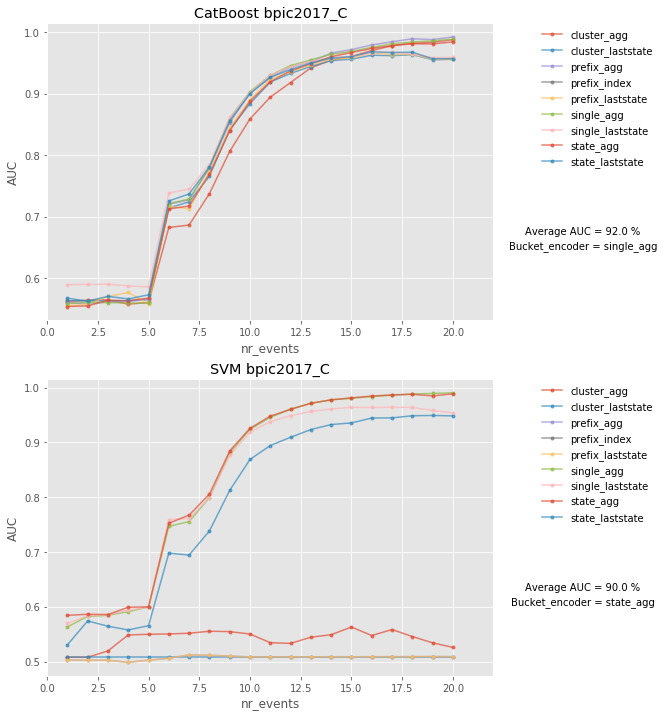


Data: sepsis_1, and clf: svm


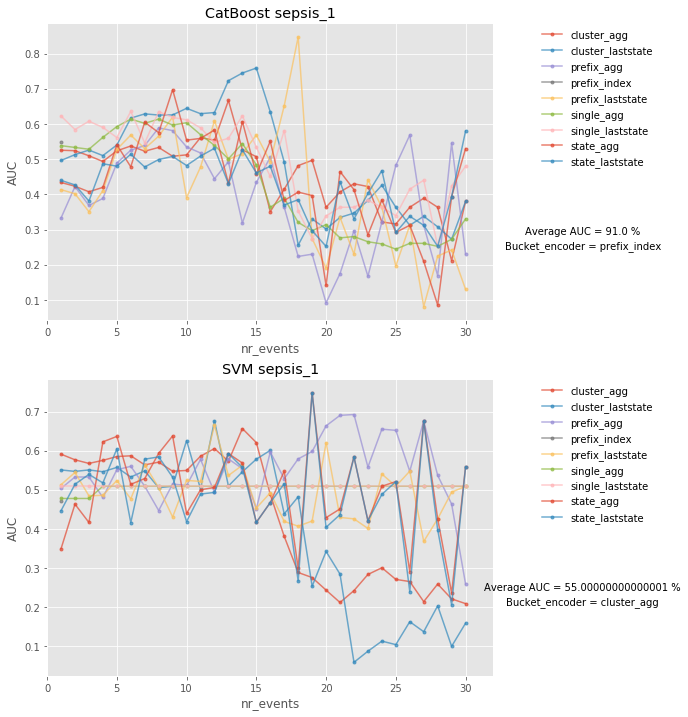


Data: bpic2012_A, and clf: svm


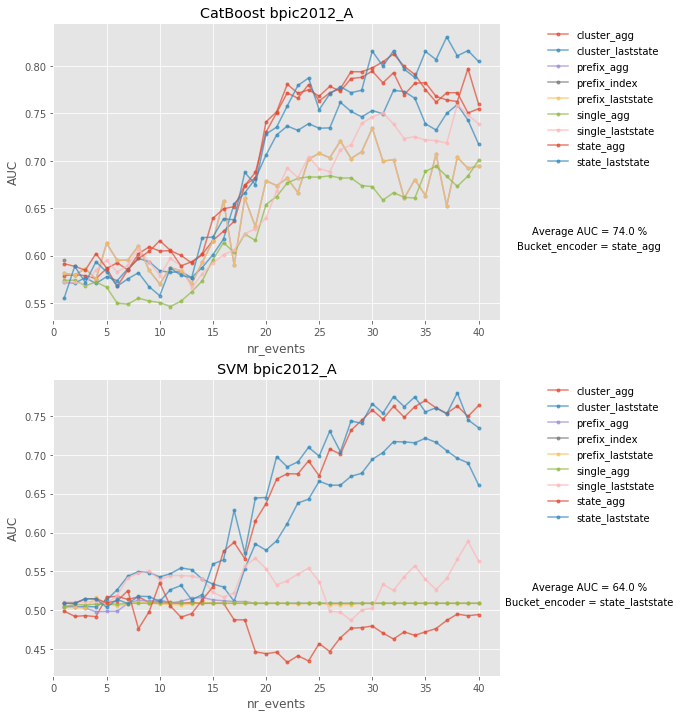


Data: bpic2017_R, and clf: svm


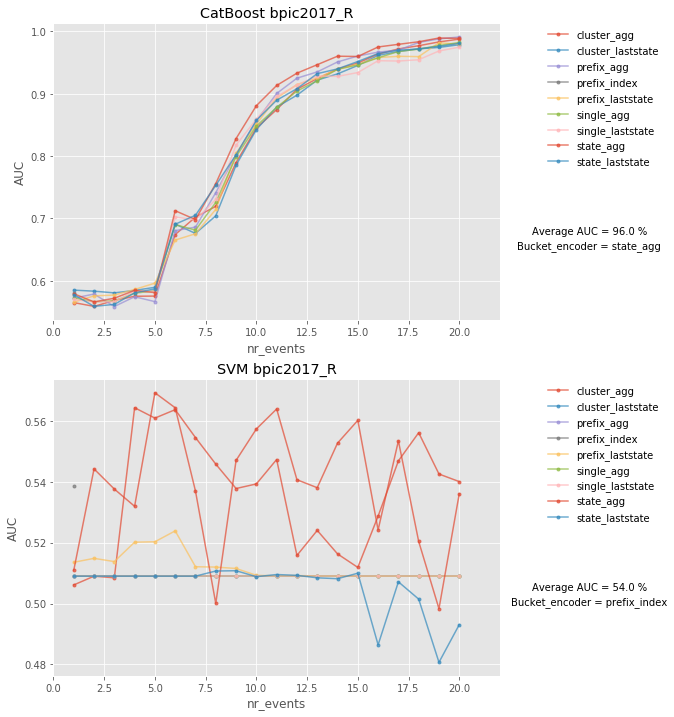


Data: production, and clf: svm


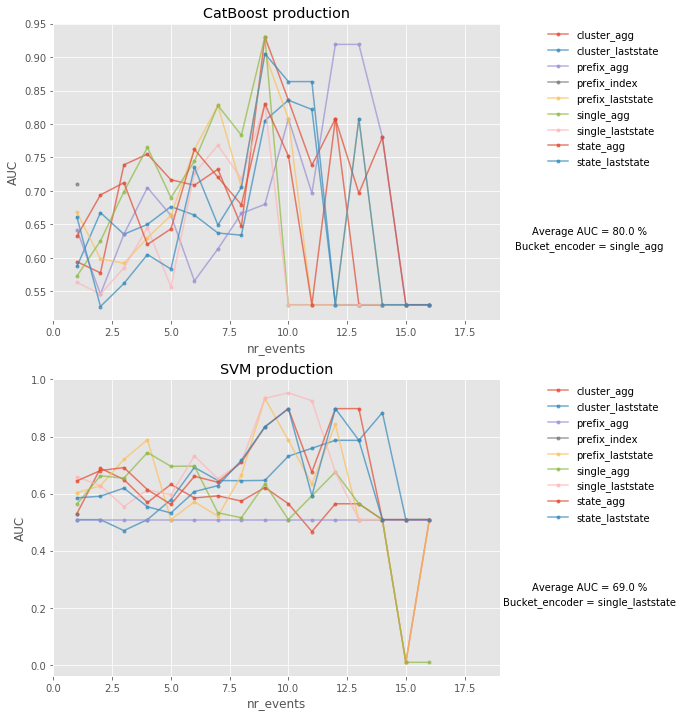


Data: bpic2011_1, and clf: svm


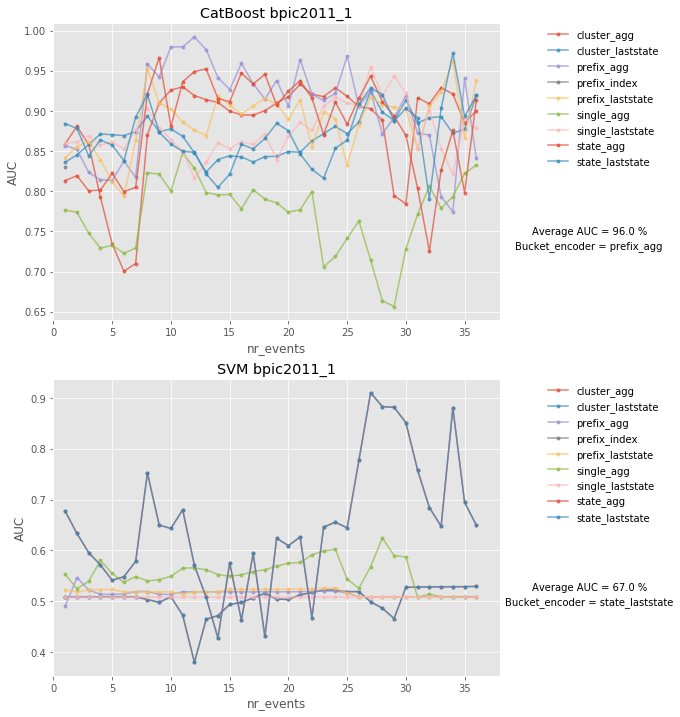


Data: traffic, and clf: svm


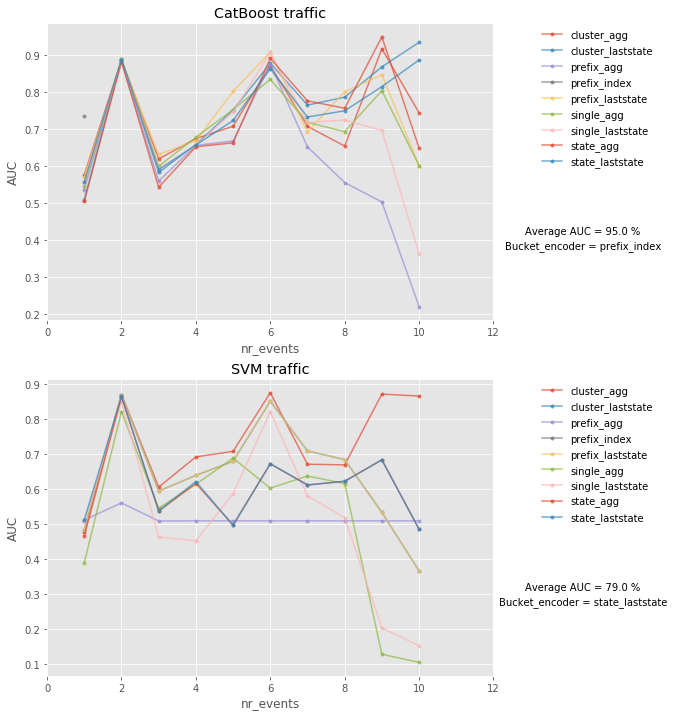


Data: bpic2012_C, and clf: svm


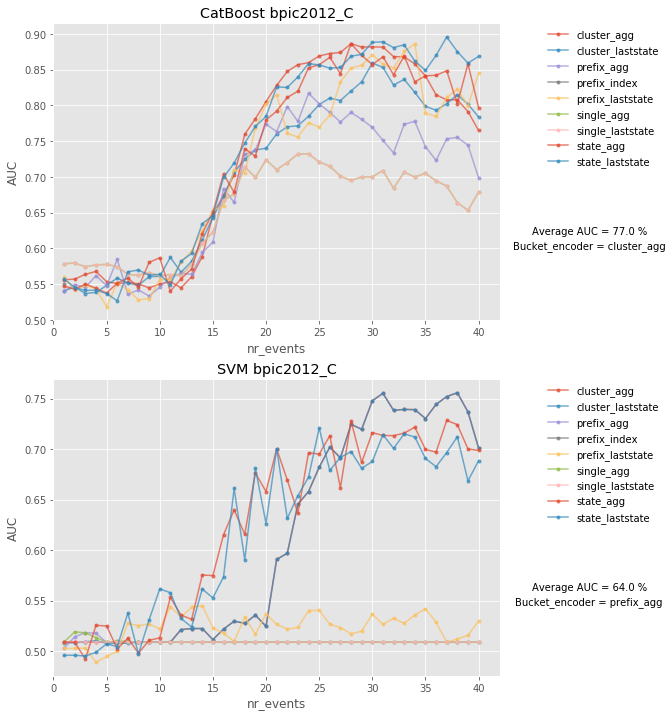


Data: bpic2015_1, and clf: svm


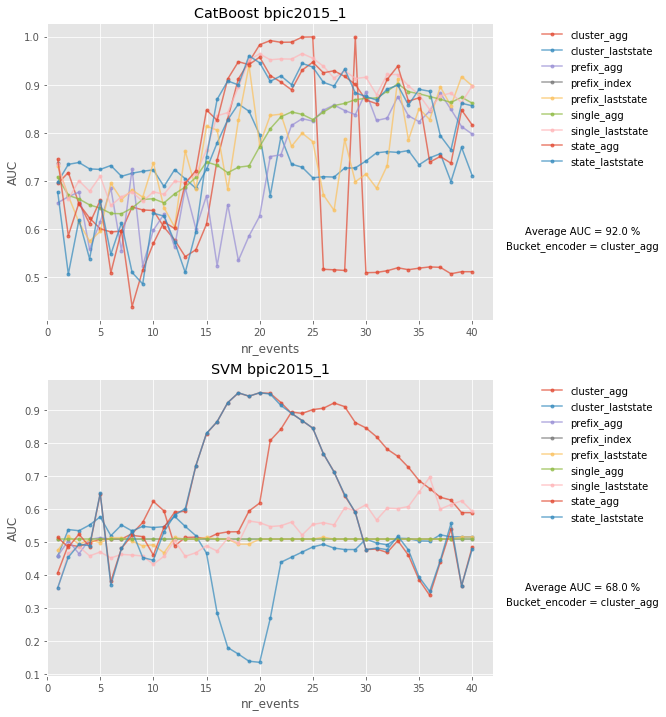


Data: bpic2017_A, and clf: svm


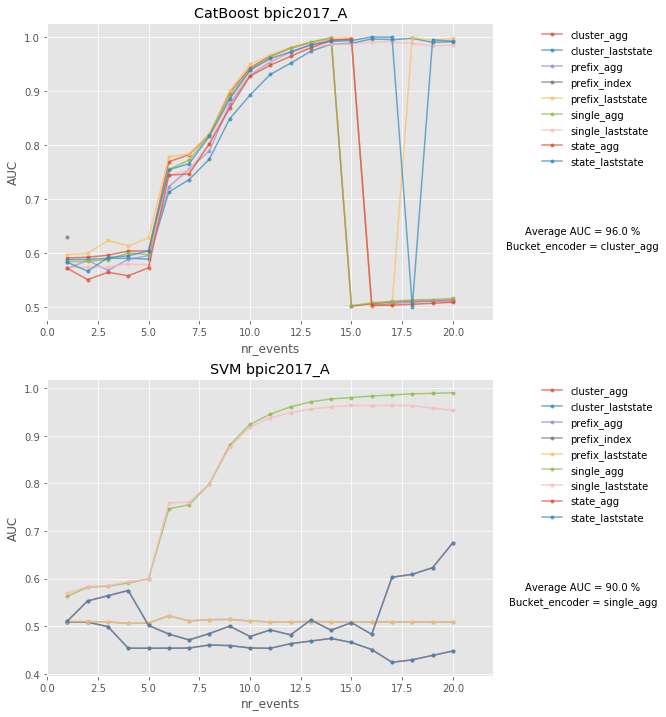


Data: bpic2012_D, and clf: svm


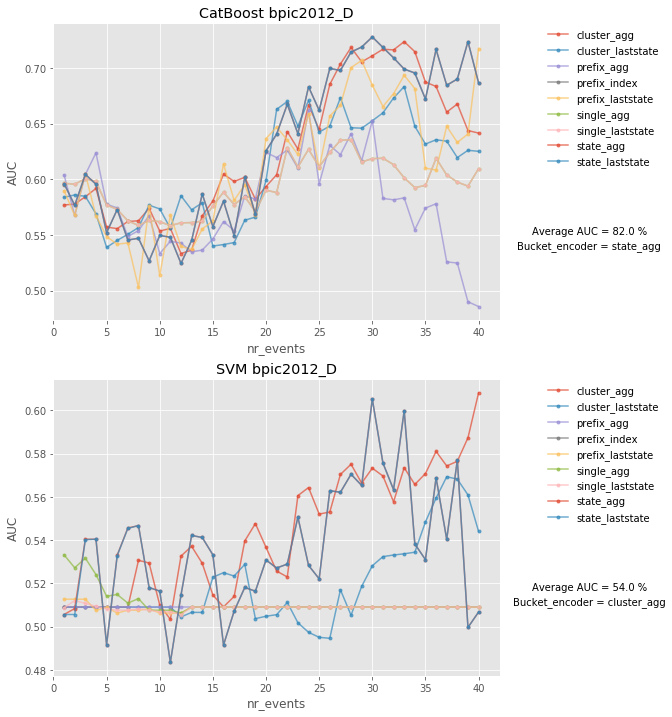

In [12]:
plot_results('./final_data/auc/data_catboost_NODUPLICATE.csv')

# Wavelet


Data: bpic2017_C, and clf: xgboost


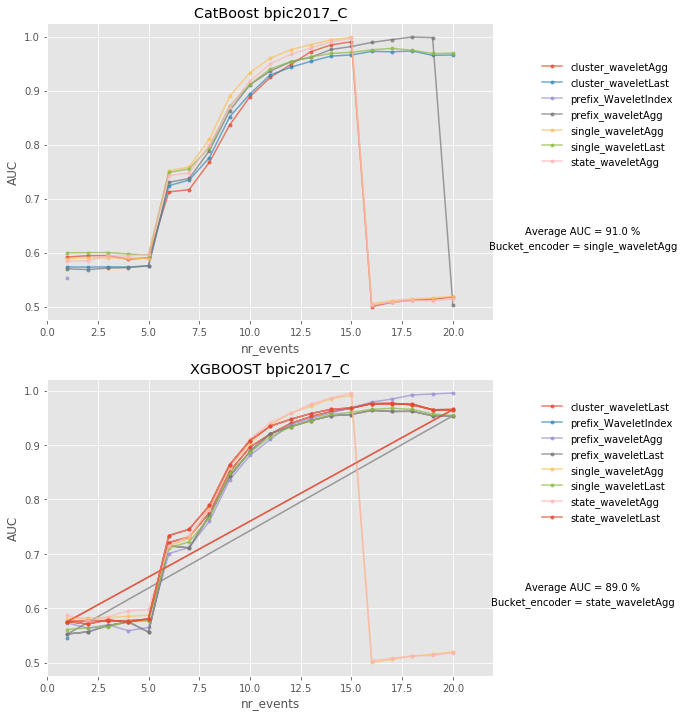


Data: sepsis_1, and clf: xgboost


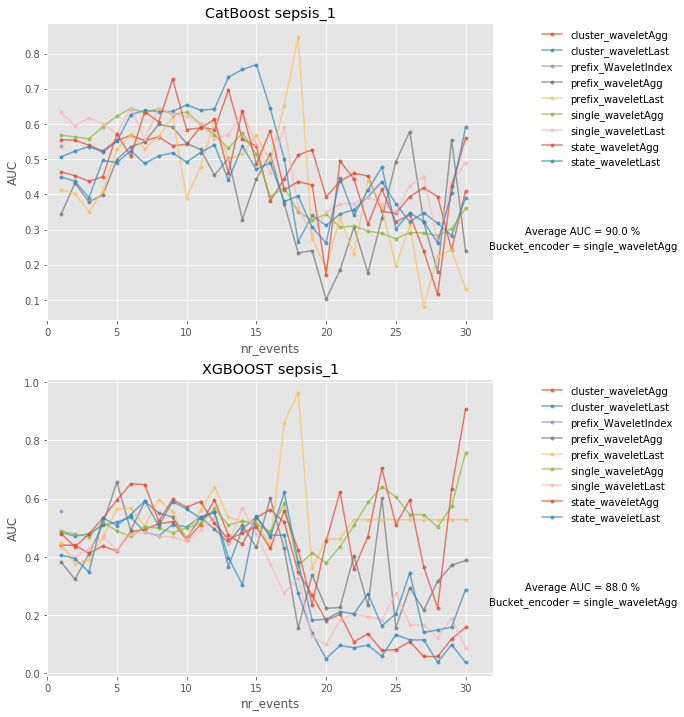


Data: bpic2012_A, and clf: xgboost


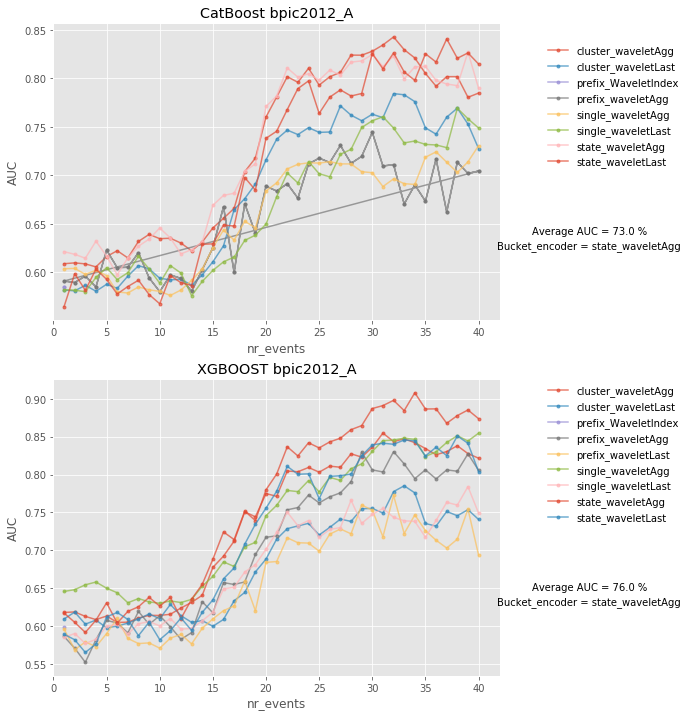


Data: bpic2017_R, and clf: xgboost


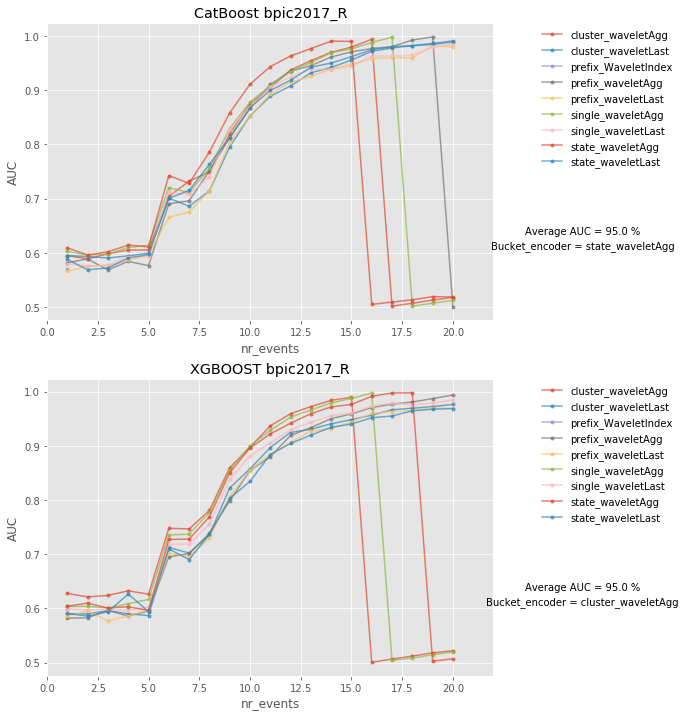


Data: production, and clf: xgboost


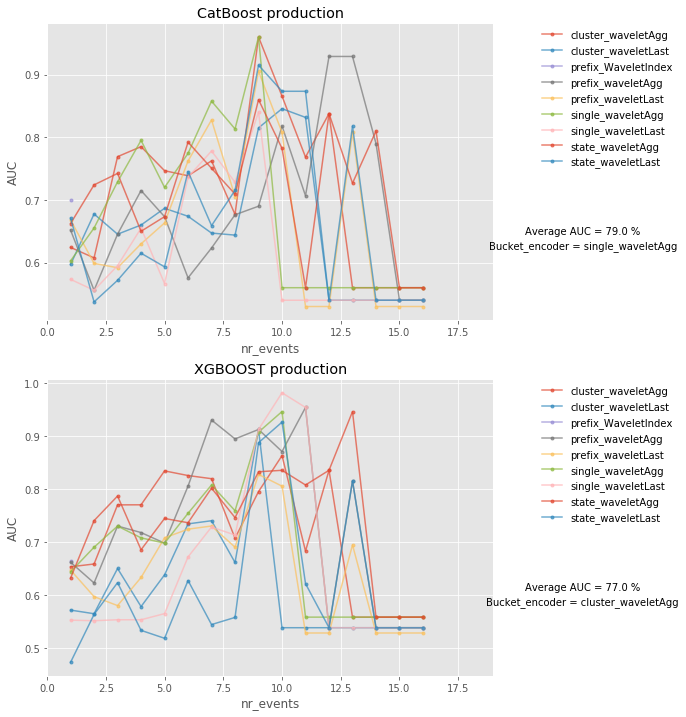


Data: bpic2011_1, and clf: xgboost


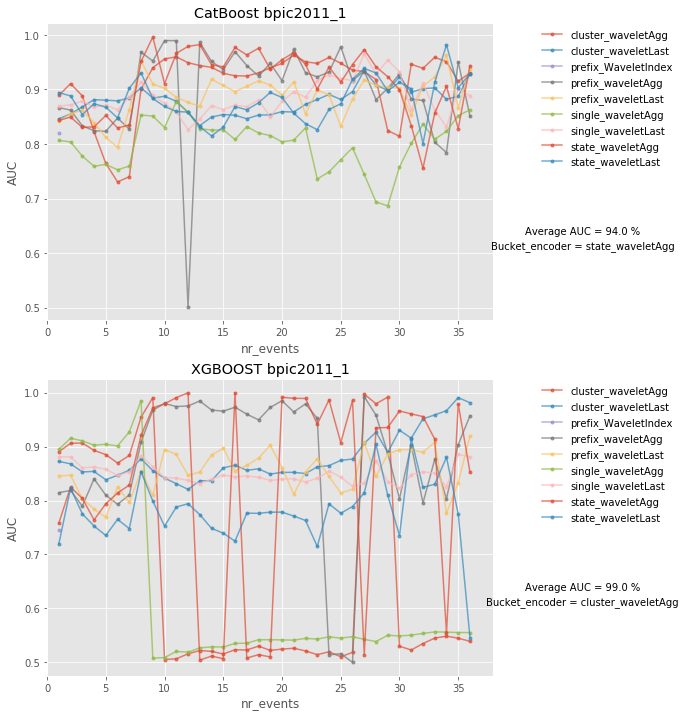


Data: traffic, and clf: xgboost


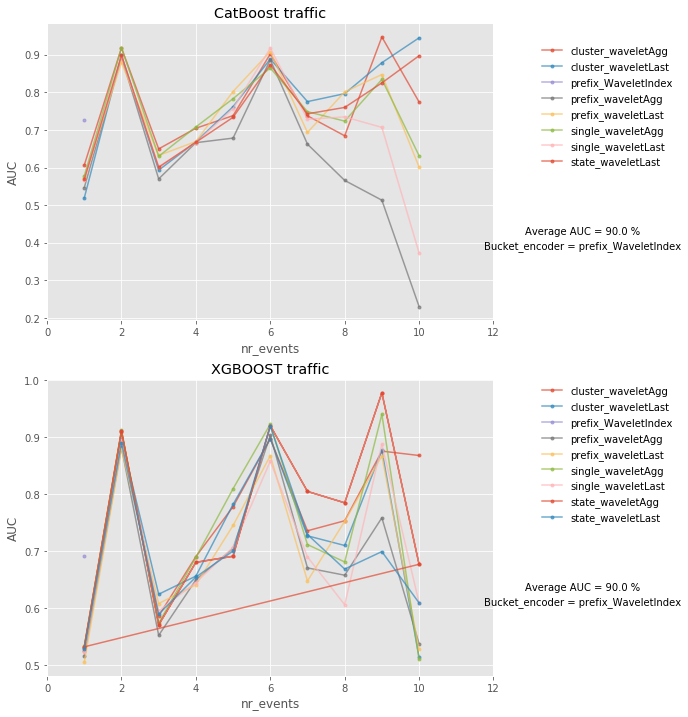


Data: bpic2012_C, and clf: xgboost


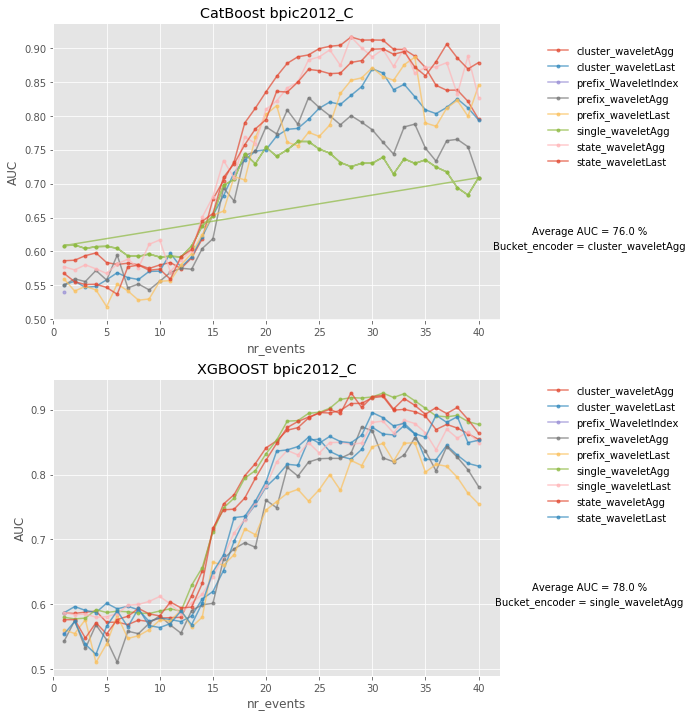


Data: bpic2015_1, and clf: xgboost


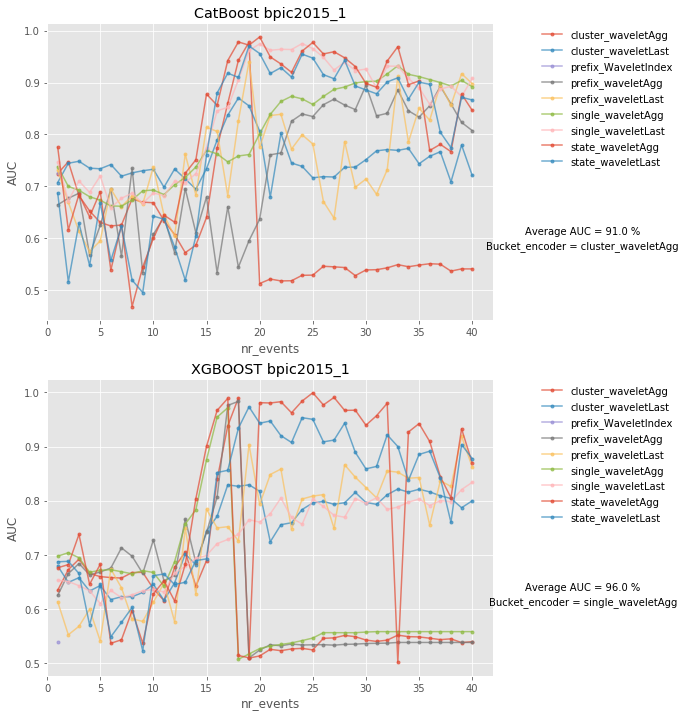


Data: bpic2017_A, and clf: xgboost


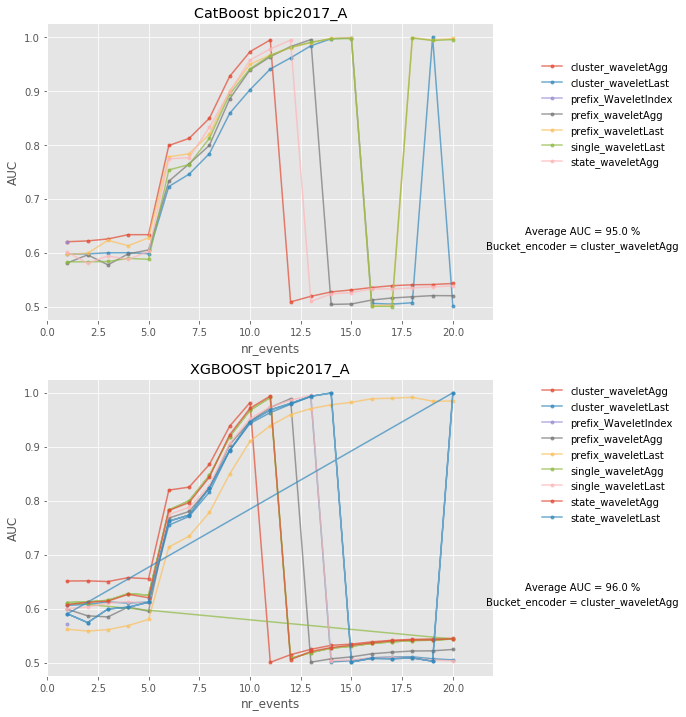


Data: bpic2012_D, and clf: xgboost


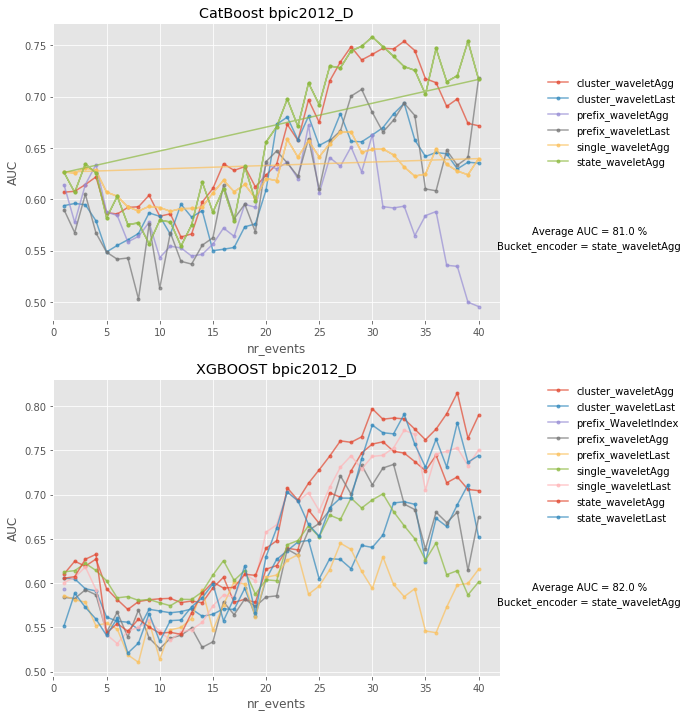

In [48]:
plot_results('./final_data/auc/data_wavelet.csv')

In [171]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pylab import figure, text, scatter, show


def plot_results_wavlet(df1, df2, df3, result_df,cls):
    
    df_orig = df1 # catboost
    df_orig_w = df2 # wavelet
    df_orig_i = df3 # inter-case features
    
    datasets = ['bpic2017_C', 'sepsis_1','sepsis_2','sepsis_3', 'bpic2012_A', 'bpic2017_R', 'production', 'bpic2011_1',
                 'bpic2011_2','bpic2011_3','bpic2011_4','bpic2012_C', 'bpic2015_1', 
                'bpic2015_2','bpic2015_3','bpic2015_4','bpic2015_4','bpic2017_A', 'bpic2012_D']
    df_orig.rename(columns = {'method':'bucket_enc'}, inplace = True) 
    df_orig_w.rename(columns = {'method':'bucket_enc'}, inplace = True)
    df_orig_i.rename(columns = {'method':'bucket_enc'}, inplace = True) 
    
    for data in datasets:
        cls = cls
        print(f"\nData: {data}, and clf: {cls}")

        
        df_other = df_orig_w[(df_orig_w['cls']==cls)]
        df_other = df_other[df_other['dataset']==data]                
        avg_auc_other = np.round(df_other[df_other['nr_events']==-1]['score'].max(),2) *100
        avg_meth_other = df_other[df_other['score']==df_other[df_other['nr_events']==-1]['score'].max()]['bucket_enc']
        df_other = df_other[df_other['nr_events']!=-1]
        df_other = df_other[df_other['metric']=='auc']
        df_other.reset_index(drop=True)

        df_cat = df_orig[(df_orig['cls']==cls)]
        df_cat = df_cat[df_cat['dataset']==data]                
        avg_auc_cat = np.round(df_cat[df_cat['nr_events']==-1]['score'].max(),2) *100
        avg_meth_cat = df_cat[df_cat['score']==df_cat[df_cat['nr_events']==-1]['score'].max()]['bucket_enc']
        df_cat = df_cat[df_cat['nr_events']!=-1]
        df_cat = df_cat[df_cat['metric']=='auc']
        df_cat.reset_index(drop=True)
        
        
        ### Inter data 
        df_inter = df_orig_i[(df_orig_i['cls']==cls)]
        df_inter = df_inter[df_inter['dataset']==data]                
        avg_auc_inter = np.round(df_inter[df_inter['nr_events']==-1]['score'].max(),2) *100
        print(avg_auc_inter)
        avg_meth_inter = df_inter[df_inter['score']==df_inter[df_inter['nr_events']==-1]['score'].max()]['bucket_enc']
        df_inter = df_inter[df_inter['nr_events']!=-1]
        df_inter = df_inter[df_inter['metric']=='auc']
        df_inter.reset_index(drop=True)
        
        
        
        


        fig = plt.figure(figsize=(8,12))
        fig.tight_layout()
        plt.subplots_adjust
        # Divide the figure into a 2x1 grid, and give me the first section
        ax1 = fig.add_subplot(311) # catboost

        # Divide the figure into a 2x1 grid, and give me the second section
        ax2 = fig.add_subplot(312) # catboost+wvalete
        
        # Divide the figure into a 2x1 grid, and give me the second section
        ax3 = fig.add_subplot(313) # Inter-case

        #df[df['bucket_enc']=='single_laststate']
        grouped1 = df_other.groupby('bucket_enc')
        max_score_other = {}
        for name, gr1 in grouped1:
            gr1.plot(x='nr_events', y='score', label = name, marker='.', alpha=0.7, ax=ax2)
            max_score_other[name]=gr1.score.max()


        grouped2 = df_cat.groupby('bucket_enc')
        max_score_cat = {}
        for name, gr2 in grouped2:
            gr2.plot(x='nr_events', y='score', label = name, marker='.', alpha=0.7, ax=ax1)
            max_score_cat[name]=gr2.score.max()
            
            
        grouped3 = df_inter.groupby('bucket_enc')
        max_score_inter = {}
        for name, gr3 in grouped3:
            gr3.plot(x='nr_events', y='score', label = name, marker='.', alpha=0.7, ax=ax3)
            max_score_inter[name]=gr3.score.max()



        #ax1.legend(bbox_to_anchor=(1.1, 0.85))
        ax1.set_xlim(xmin=0)
        ax2.set_xlim(xmin=0)
        ax3.set_xlim(xmin=0)
        
        ax1.set_xlim(xmax= 2 +max(list(df_cat['nr_events'])))
        ax2.set_xlim(xmax=2 +max(list(df_other['nr_events'])))
        ax3.set_xlim(xmax=2 +max(list(df_other['nr_events'])))
        
        ax1.legend(loc='lower left',bbox_to_anchor= (1.01, 0.2), ncol=1,
                   borderaxespad=0, frameon=False)
        ax1.set_title(cls+" "+data)
        ax1.set(ylabel='AUC')
        ax1.set_xlabel('')
        text(1.2, 0.1,"Average AUC = "+ str(avg_auc_cat) +" %", ha='center', va='center', transform=ax1.transAxes)

        text(1.2, 0.025,"Bucket_encoder = "+str(list(avg_meth_cat)[0]), ha='center', va='center', transform=ax1.transAxes)



        ax2.legend(bbox_to_anchor=(1.1, 0.85))
        ax2.legend(loc='lower left', bbox_to_anchor= (1.01, 0.2), ncol=1,
                   borderaxespad=0, frameon=False)
        ax2.set_title(cls+" "+data+" Wavelet")
        ax2.set(ylabel='AUC')
        ax2.set_xlabel('')
        text(1.2, 0.1,"Average AUC = "+ str(avg_auc_other)+" %", ha='center', va='center', transform=ax2.transAxes)
        text(1.2, 0.025,"Bucket_encoder = "+str(list(avg_meth_other)[0]), ha='center', va='center', transform=ax2.transAxes)

        
        
        #ax3.legend(bbox_to_anchor=(1.1, 0.85))
        ax3.legend(loc='lower left', bbox_to_anchor= (1.01, 0.2), ncol=1,
                   borderaxespad=0, frameon=False)
        ax3.set_title(cls+" "+data+" Inter")
        ax3.set(ylabel='AUC')
        ax3.set_xlabel('# Events')
        text(1.2, 0.1,"Average AUC = "+ str(avg_auc_inter)+" %", ha='center', va='center', transform=ax3.transAxes)
        text(1.2, 0.025,"Bucket_encoder = "+str(list(avg_meth_inter)[0]), ha='center', va='center', transform=ax3.transAxes)



        #plt.savefig("./images_clfs/inter/logit/"+data+".pdf",  bbox_inches='tight')
        result = [{'dataset':data,'cls':cls,'auc':avg_auc_cat,
                   'wavelet_auc':avg_auc_other,'inter_auc': avg_auc_inter}]
        result_df = result_df.append(result,True)
        plt.show()
    return result_df
        



In [172]:
df1 = pd.read_csv('./final_data/auc/data_catboost.csv', sep =';') # 
df2 = pd.read_csv('./final_data/auc/data_wavelet.csv', sep =';')

df3 = pd.read_csv('./final_data/auc/Inter_data_catboost.csv', sep =';')

result_df = pd.DataFrame(columns=['dataset','cls','auc','wavelet_auc','inter_auc'])
result_df

All_Results = pd.DataFrame()



{'bpic2015_2', 'bpic2012_A', 'bpic2017_A', 'bpic2011_1', 'bpic2012_D', 'bpic2012_C', 'sepsis_3', 'bpic2011_2', 'bpic2015_3', 'bpic2015_5', 'production', 'bpic2011_4', 'bpic2017_C', 'bpic2017_R', 'bpic2015_4', 'sepsis_1', 'bpic2011_3', 'bpic2015_1', 'sepsis_2'}



Data: bpic2017_C, and clf: catboost
99.0


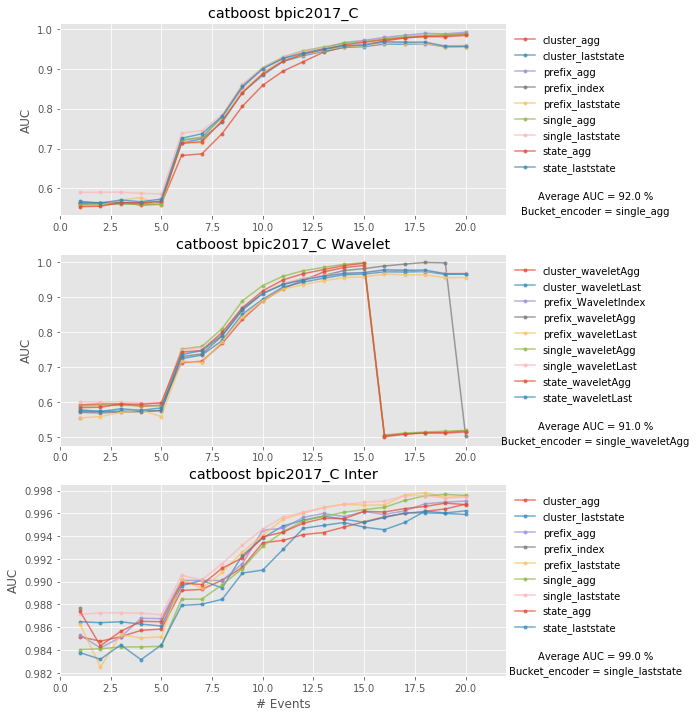


Data: sepsis_1, and clf: catboost
84.0


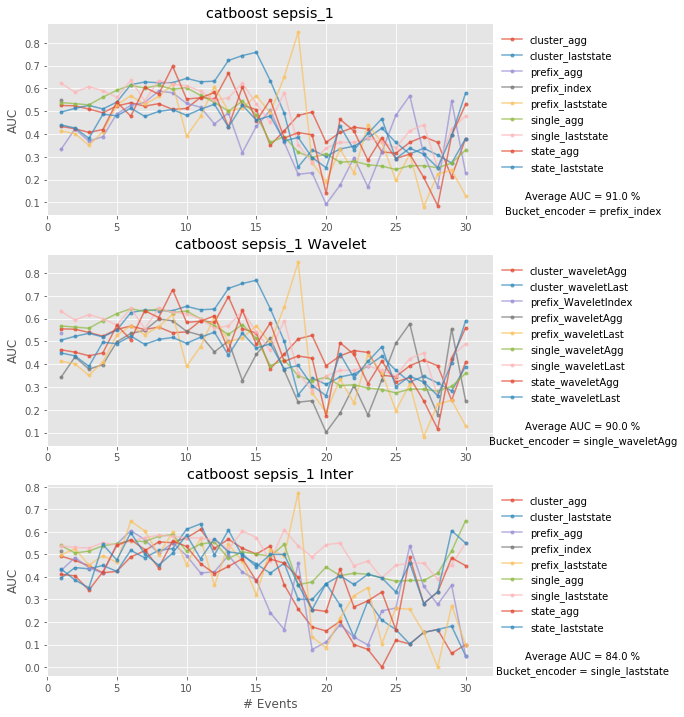


Data: sepsis_2, and clf: catboost
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

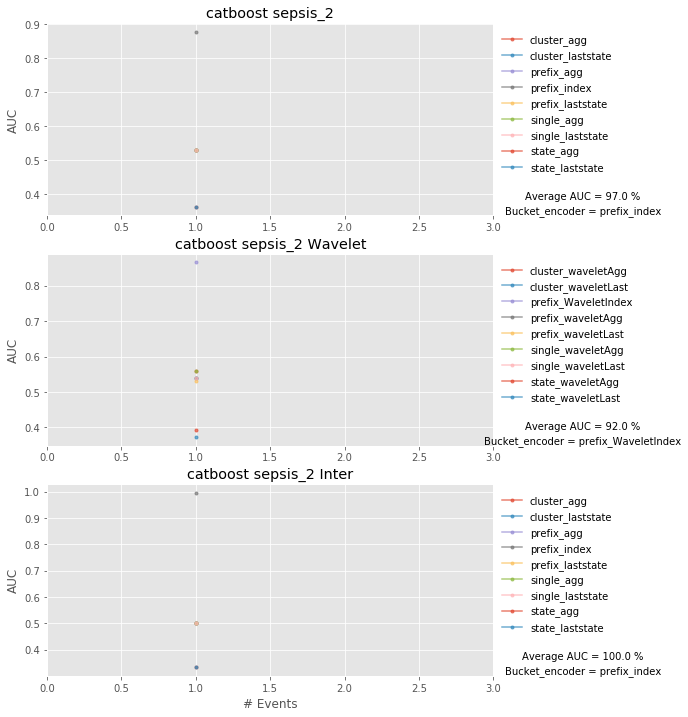


Data: sepsis_3, and clf: catboost
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

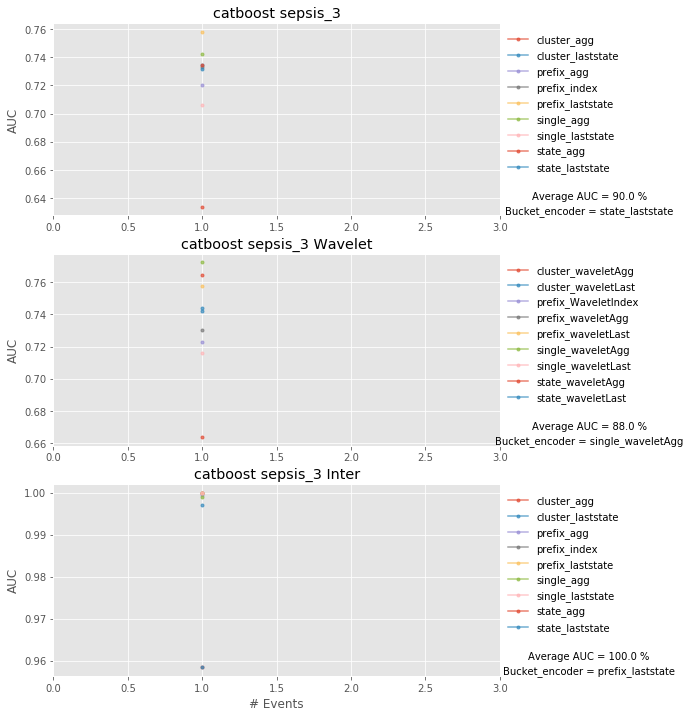


Data: bpic2012_A, and clf: catboost
83.0


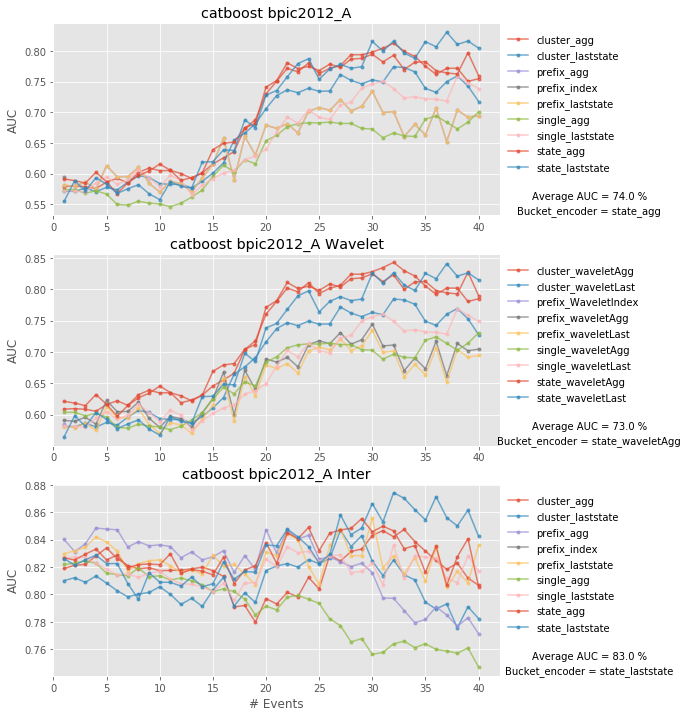


Data: bpic2017_R, and clf: catboost
94.0


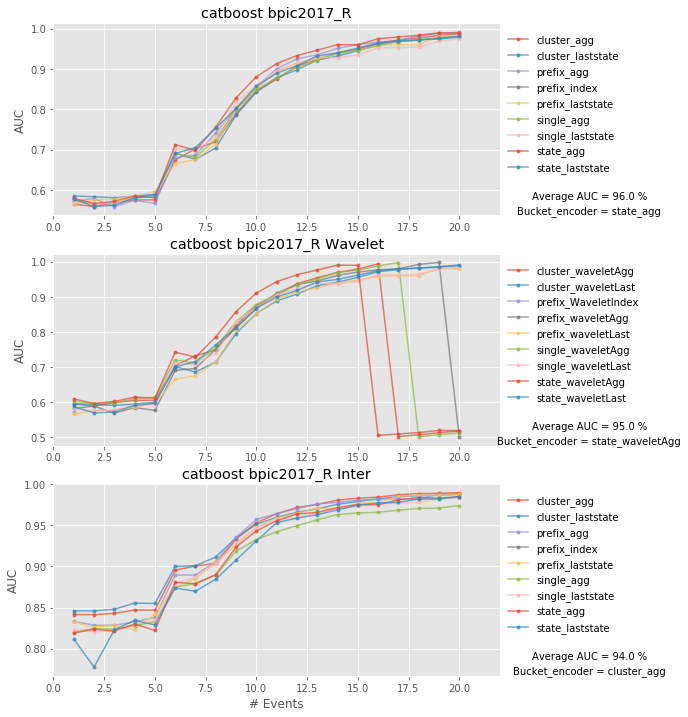


Data: production, and clf: catboost
79.0


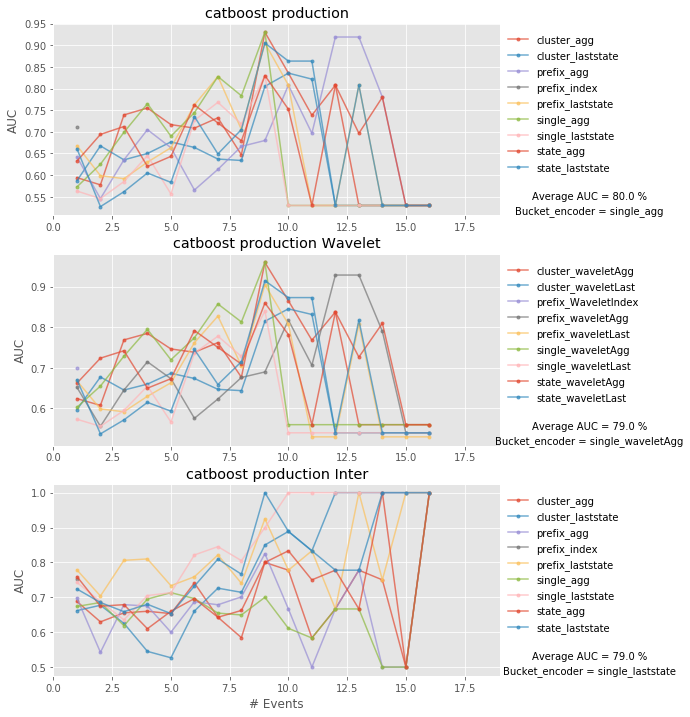


Data: bpic2011_1, and clf: catboost
100.0


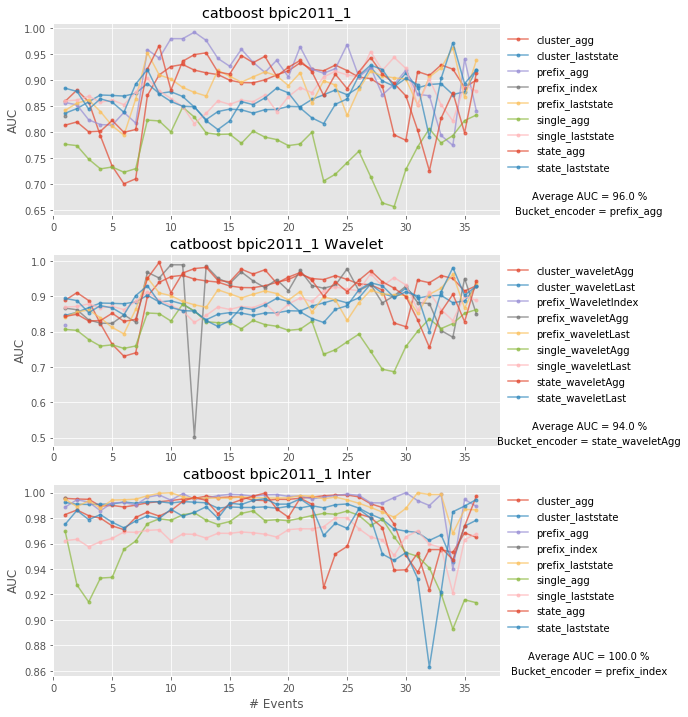


Data: bpic2011_2, and clf: catboost
98.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

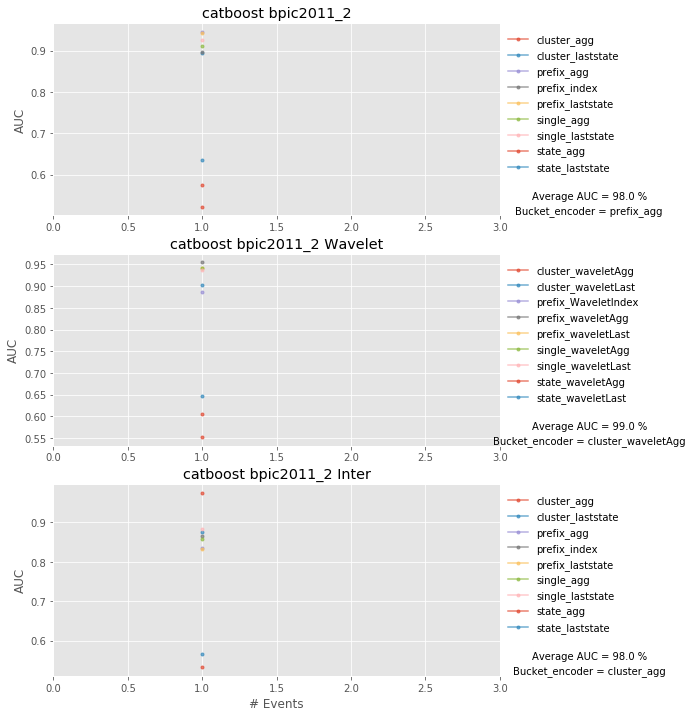


Data: bpic2011_3, and clf: catboost
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

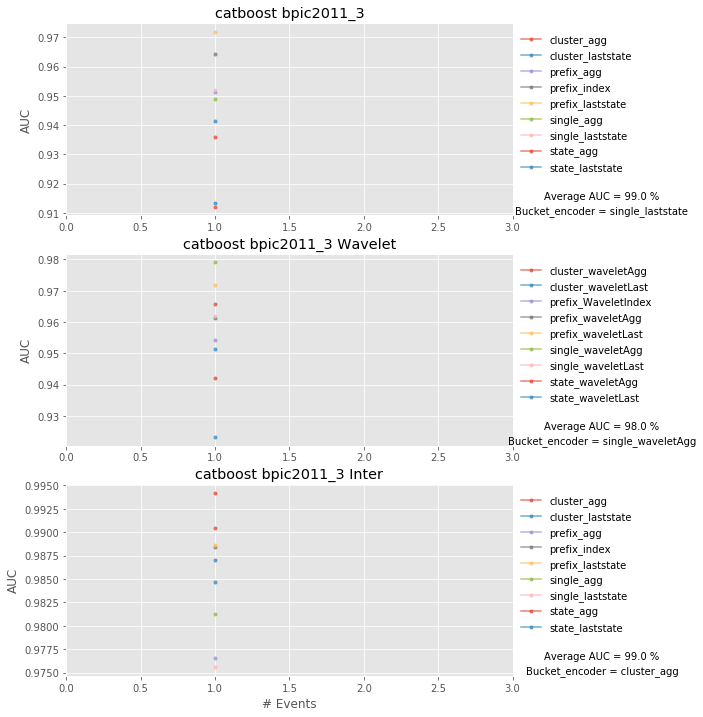


Data: bpic2011_4, and clf: catboost
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

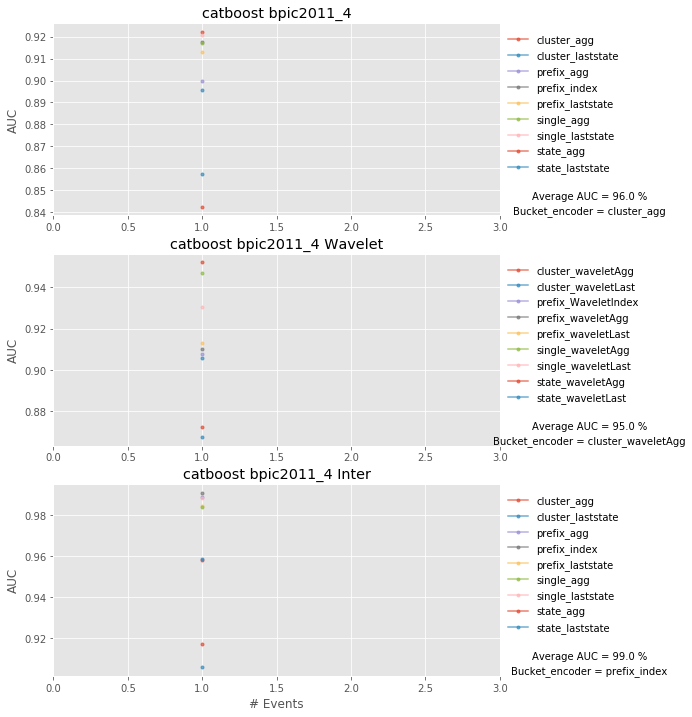


Data: bpic2012_C, and clf: catboost
97.0


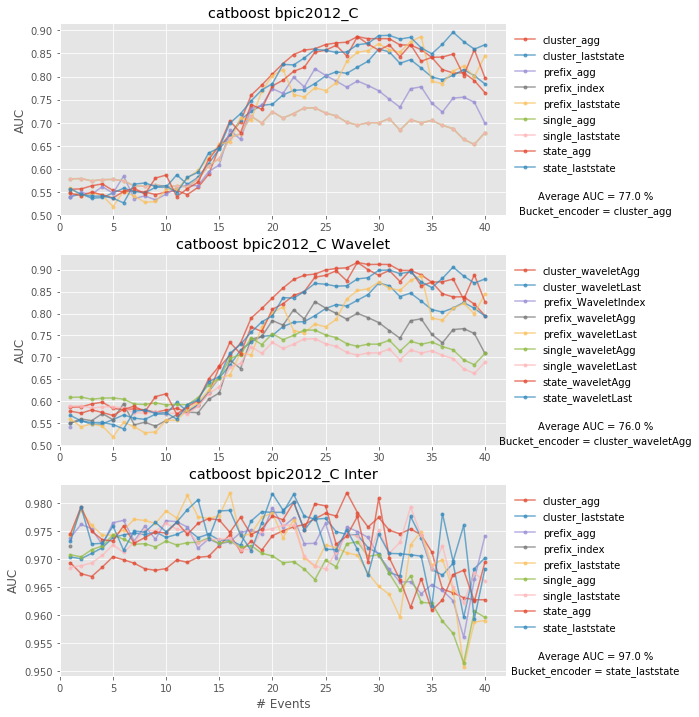


Data: bpic2015_1, and clf: catboost
88.0


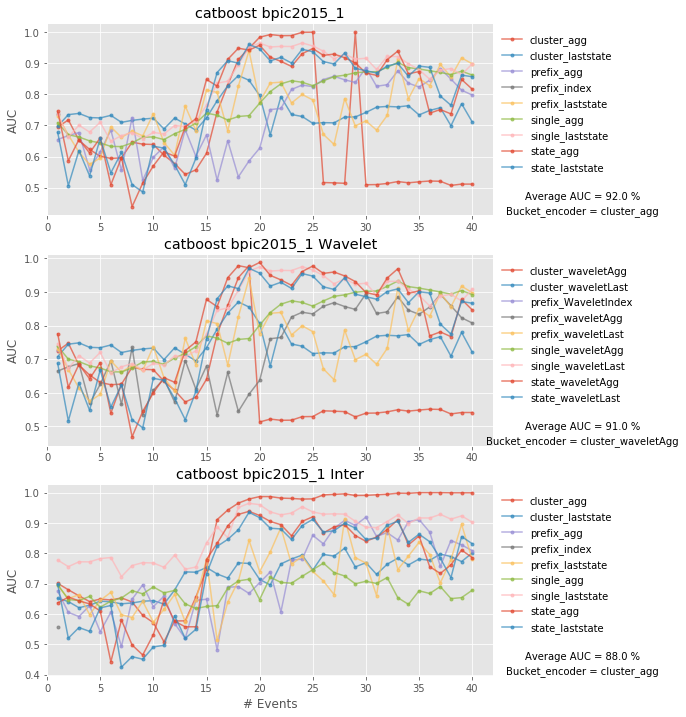


Data: bpic2015_2, and clf: catboost
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

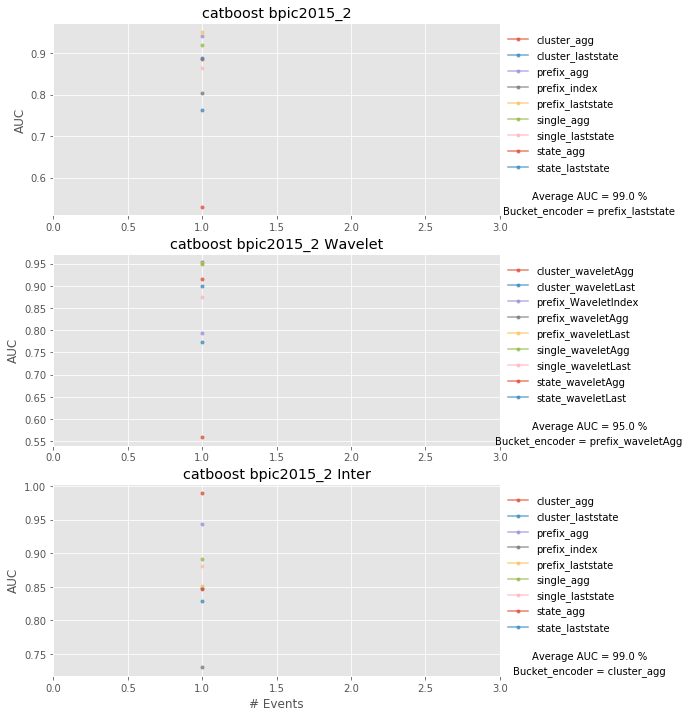


Data: bpic2015_3, and clf: catboost
69.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

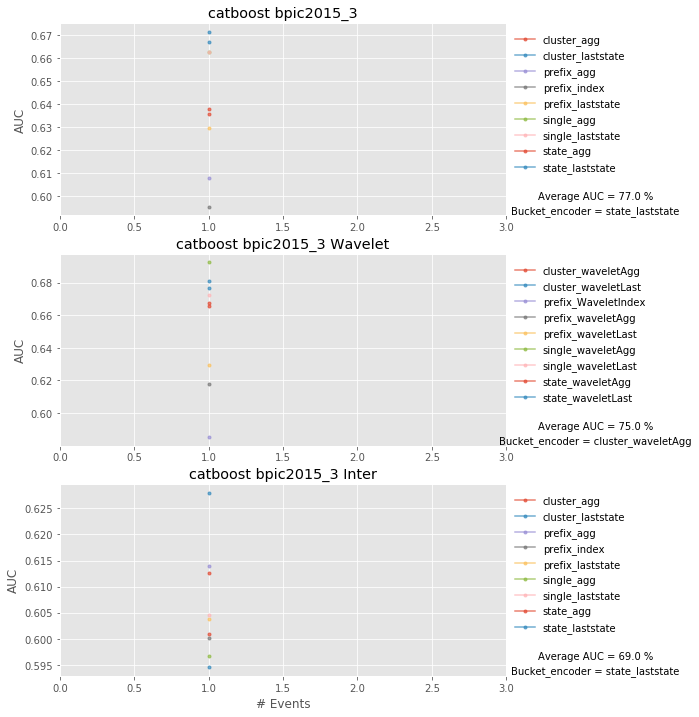


Data: bpic2015_4, and clf: catboost
84.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

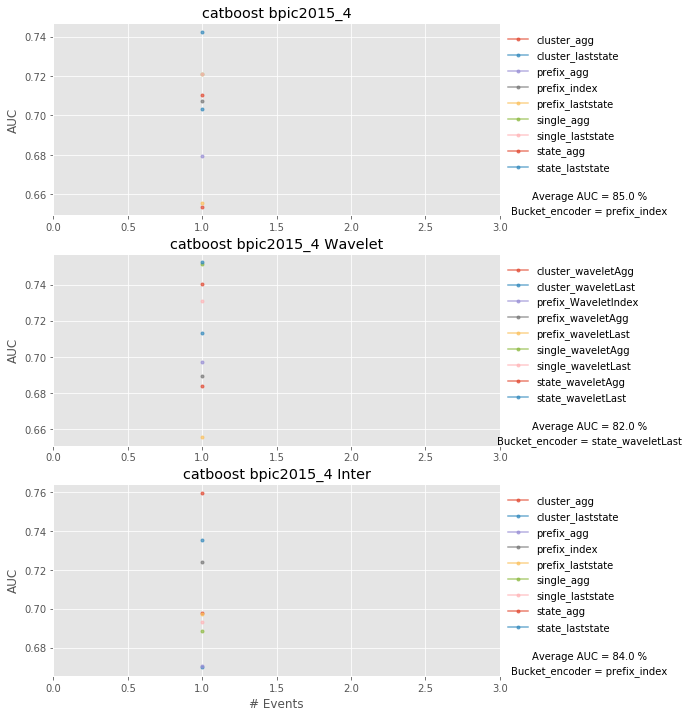


Data: bpic2015_4, and clf: catboost
84.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

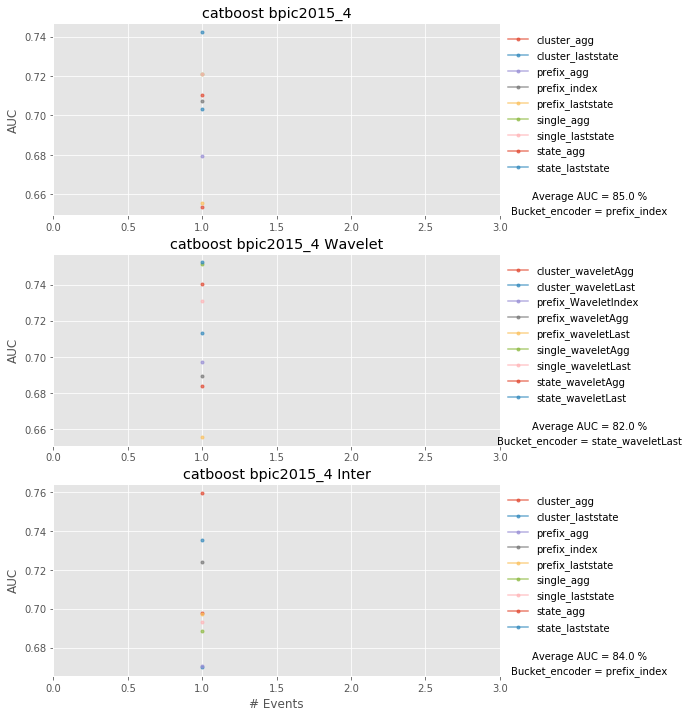


Data: bpic2017_A, and clf: catboost
98.0


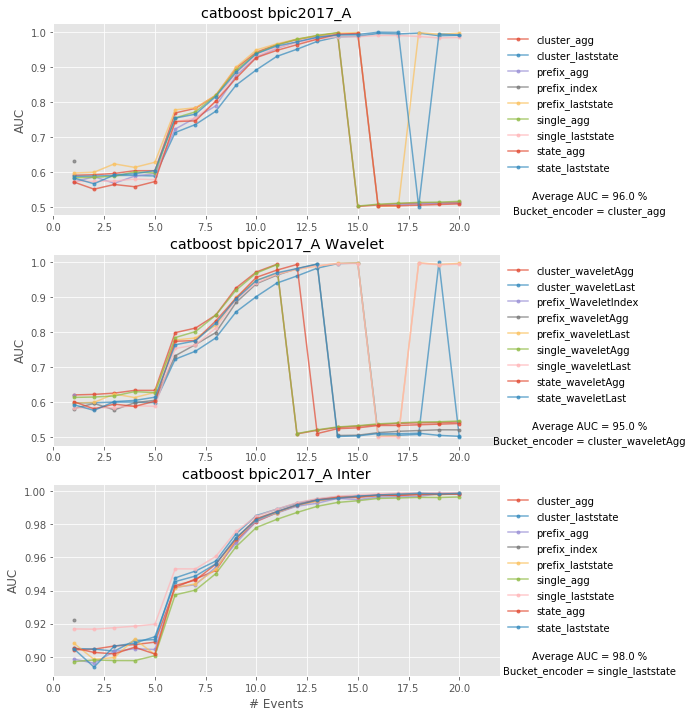


Data: bpic2012_D, and clf: catboost
77.0


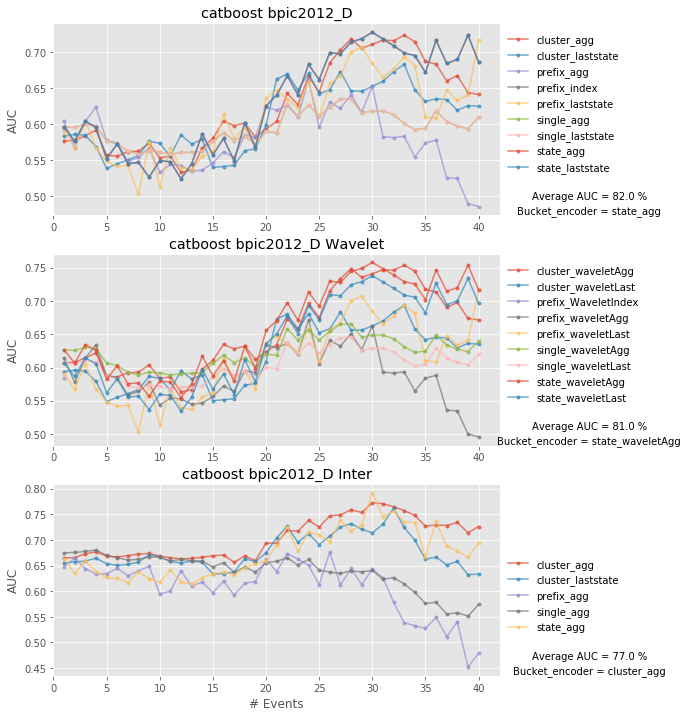


Data: bpic2017_C, and clf: xgboost
99.0


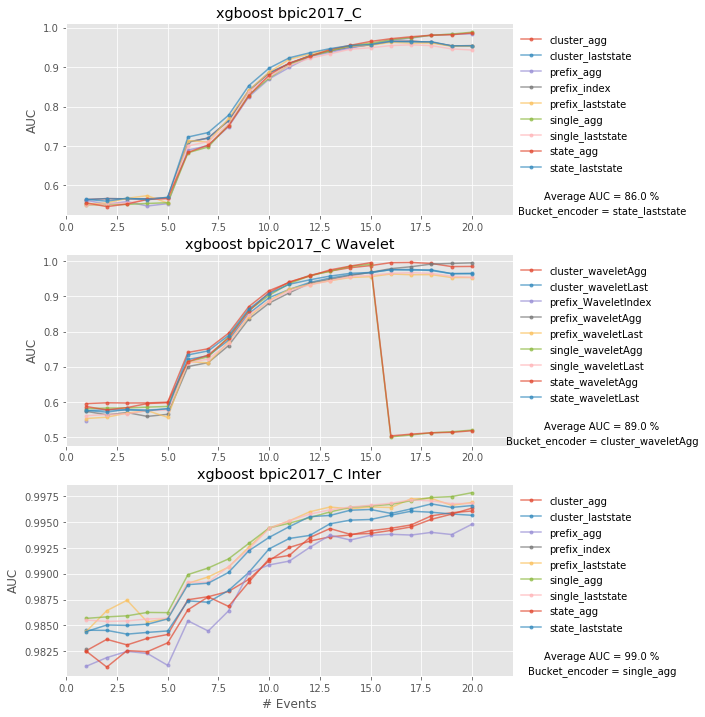


Data: sepsis_1, and clf: xgboost
86.0


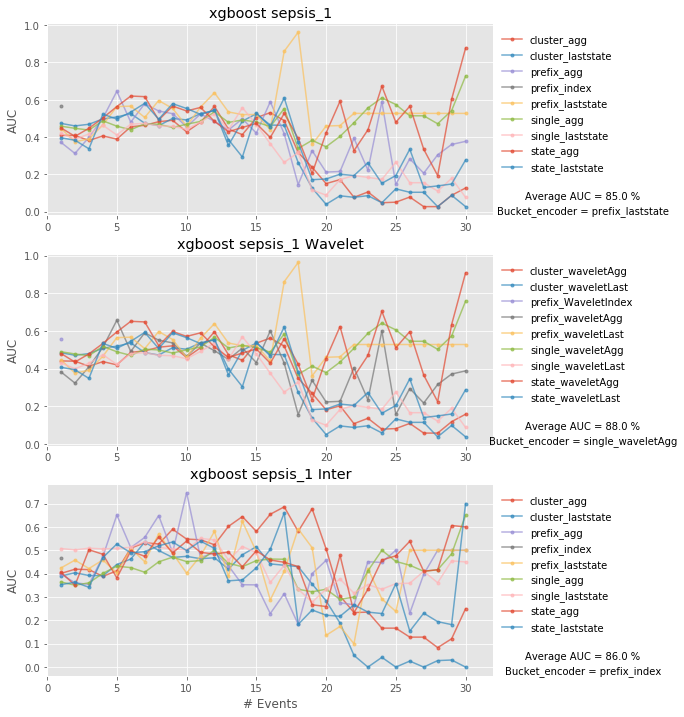


Data: sepsis_2, and clf: xgboost
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

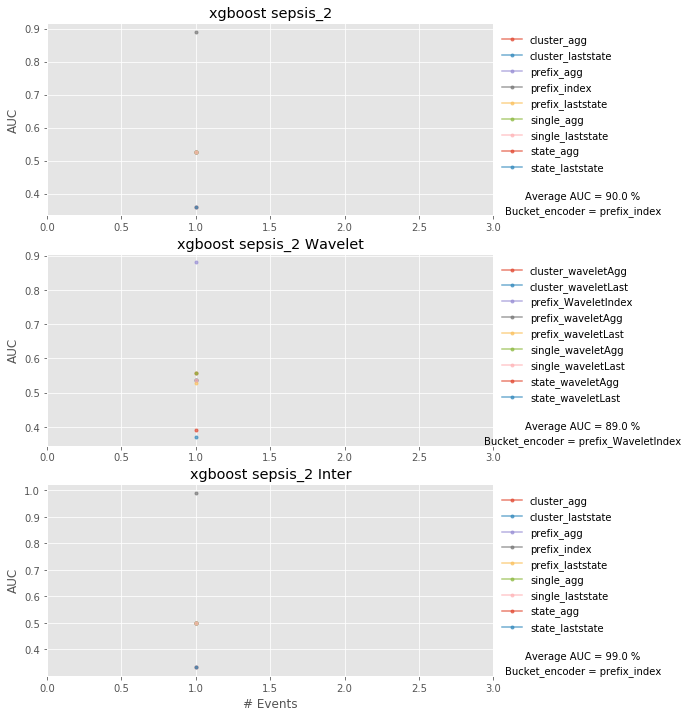


Data: sepsis_3, and clf: xgboost
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

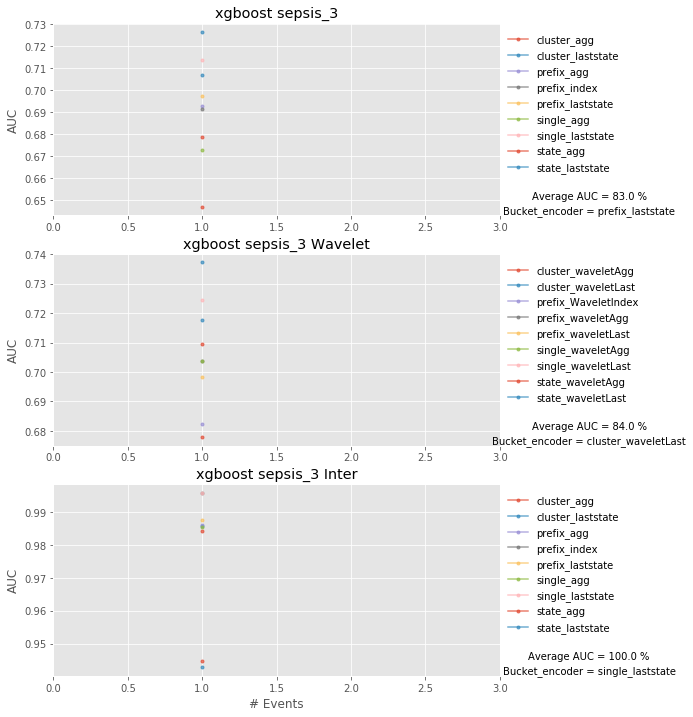


Data: bpic2012_A, and clf: xgboost
85.0


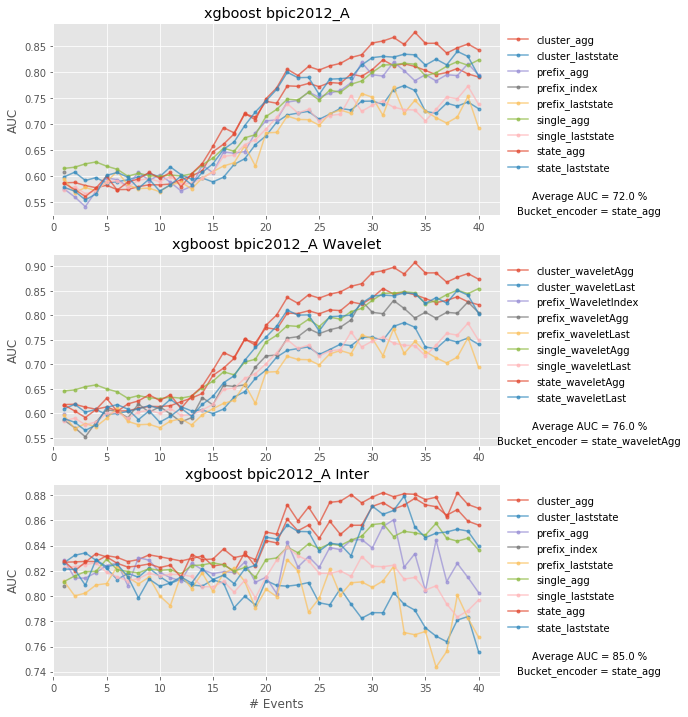


Data: bpic2017_R, and clf: xgboost
96.0


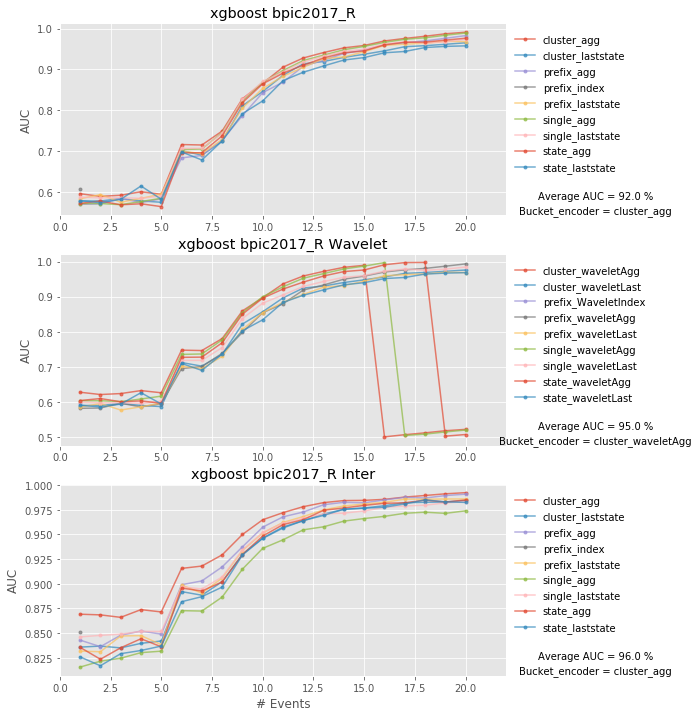


Data: production, and clf: xgboost
76.0


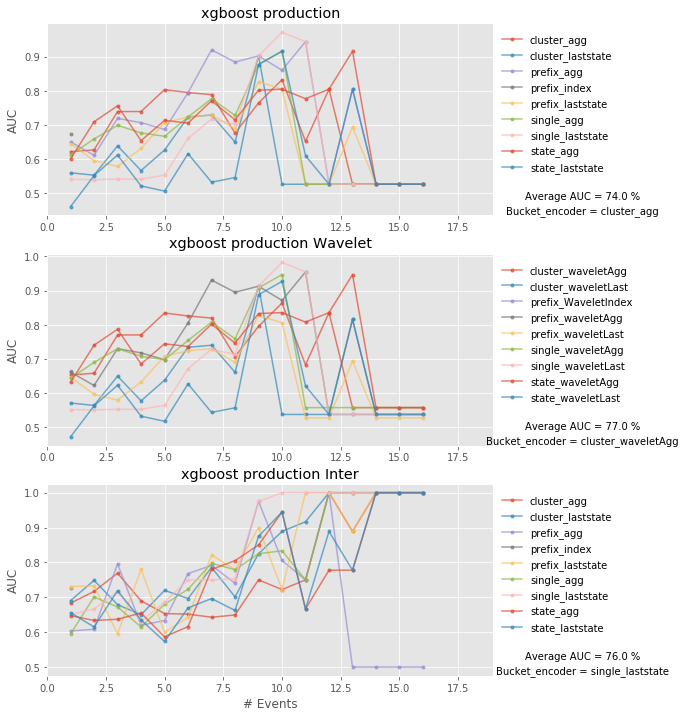


Data: bpic2011_1, and clf: xgboost
100.0


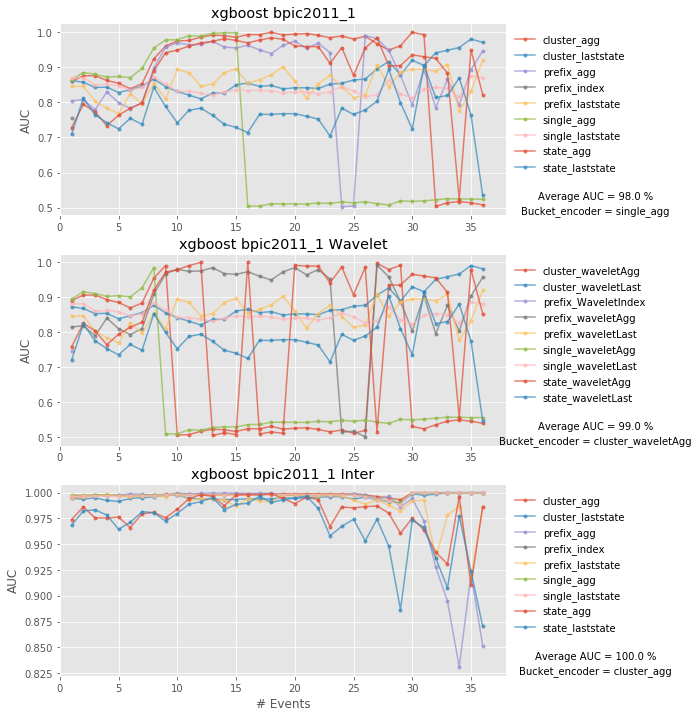


Data: bpic2011_2, and clf: xgboost
98.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

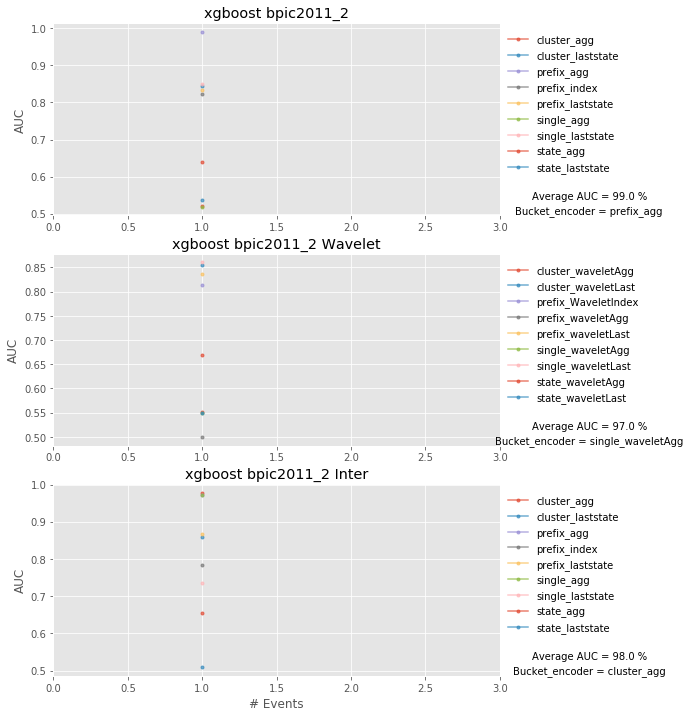


Data: bpic2011_3, and clf: xgboost
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

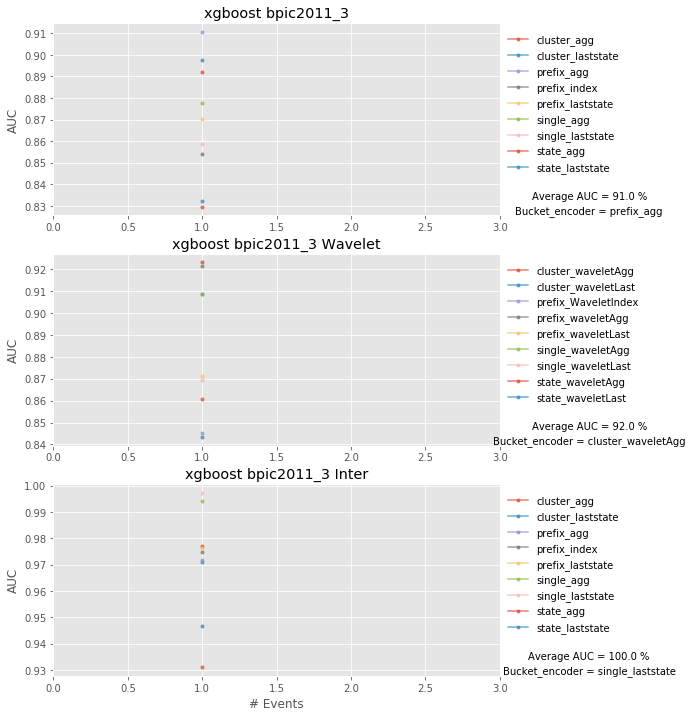


Data: bpic2011_4, and clf: xgboost
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

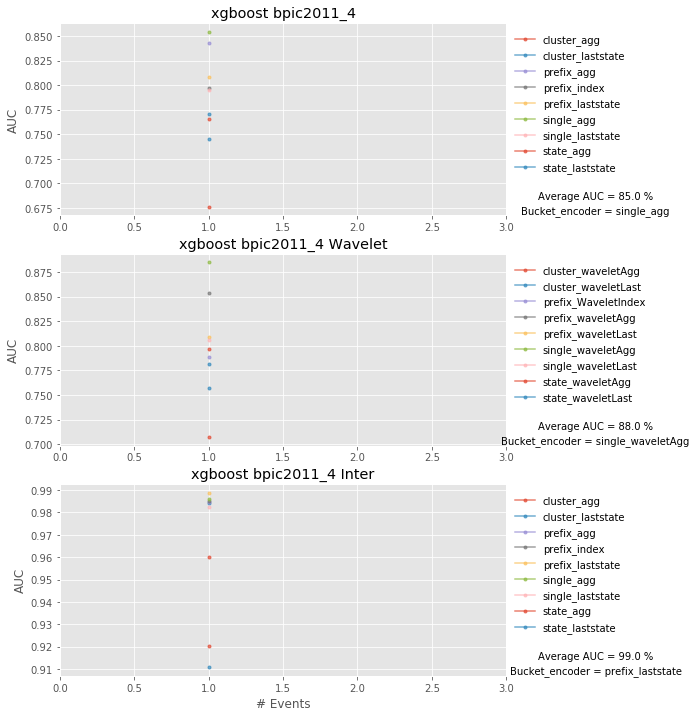


Data: bpic2012_C, and clf: xgboost
98.0


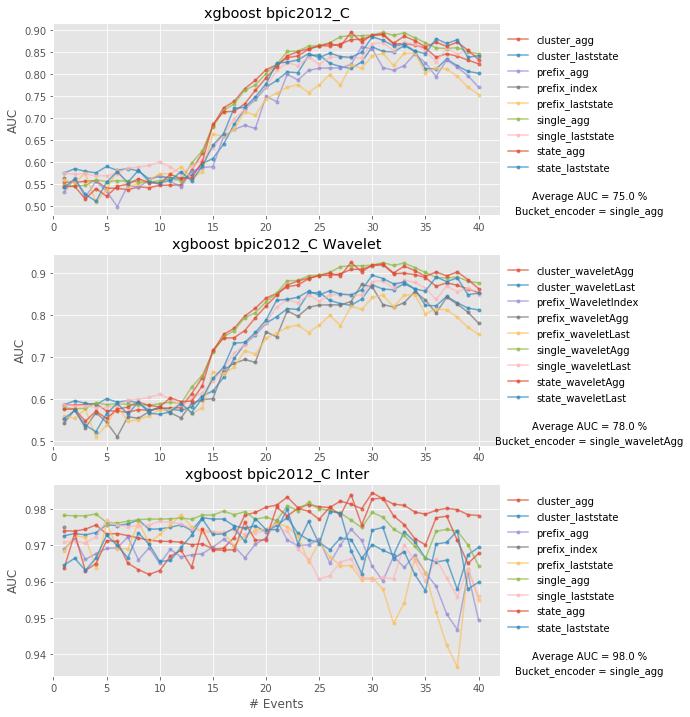


Data: bpic2015_1, and clf: xgboost
88.0


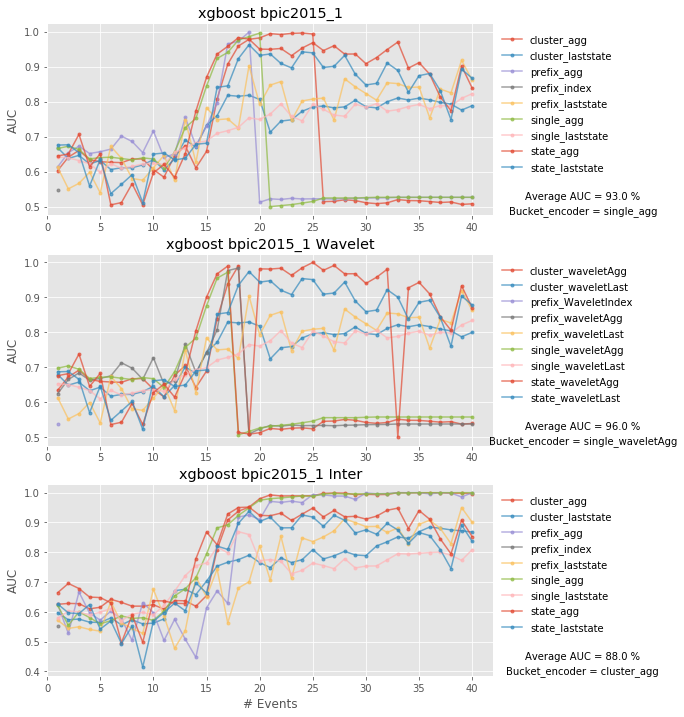


Data: bpic2015_2, and clf: xgboost
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

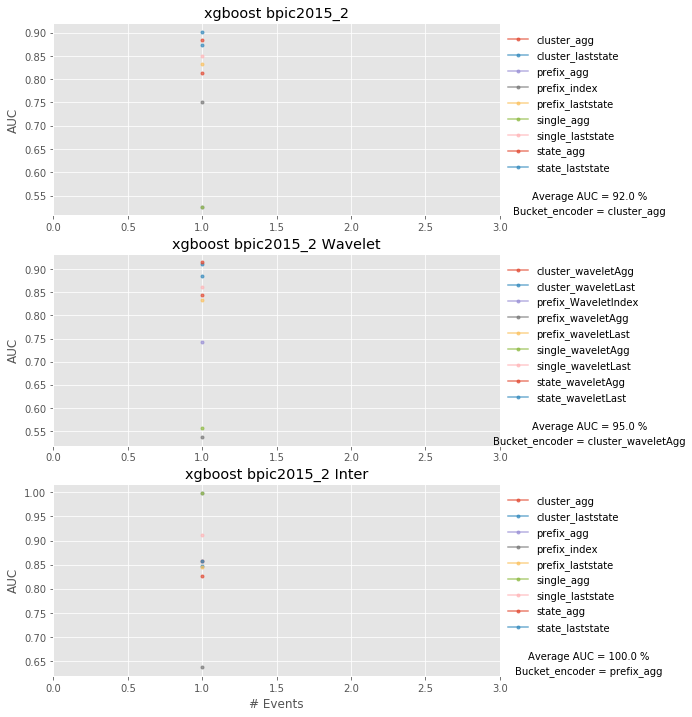


Data: bpic2015_3, and clf: xgboost
71.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

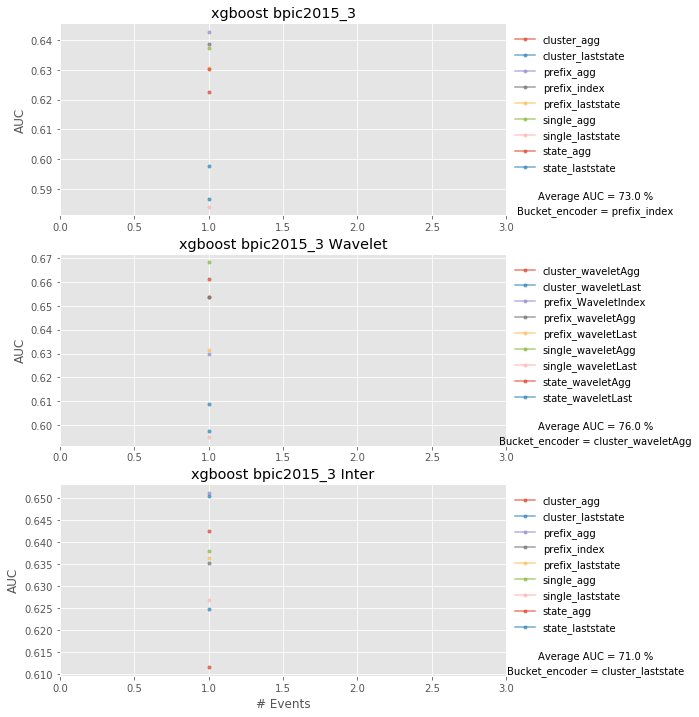


Data: bpic2015_4, and clf: xgboost
78.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

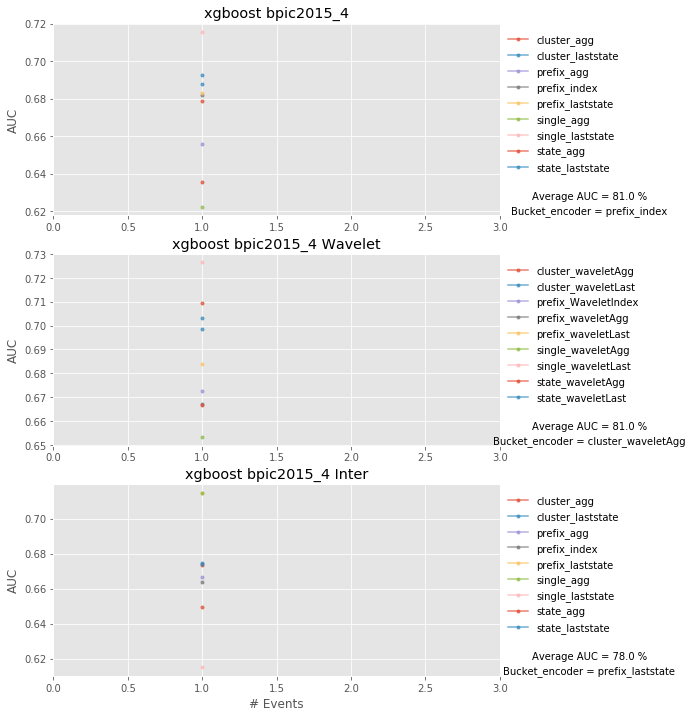


Data: bpic2015_4, and clf: xgboost
78.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

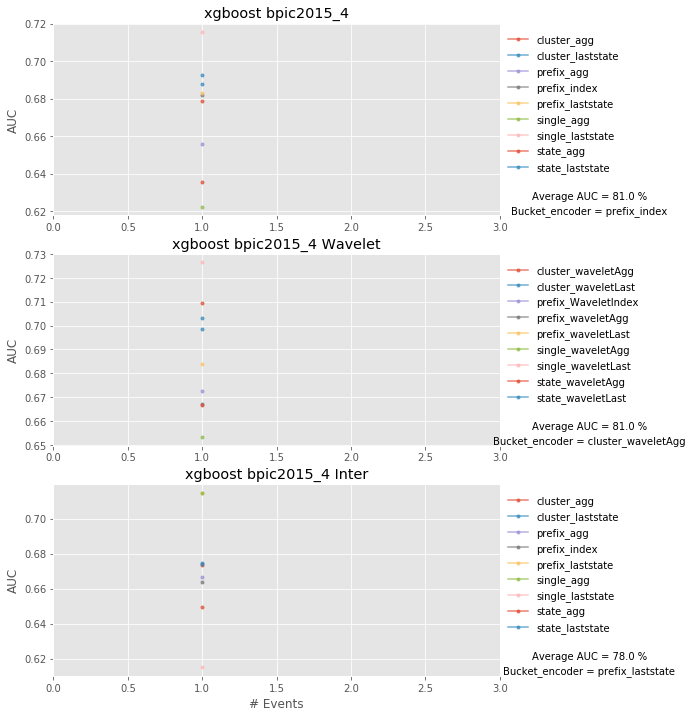


Data: bpic2017_A, and clf: xgboost
98.0


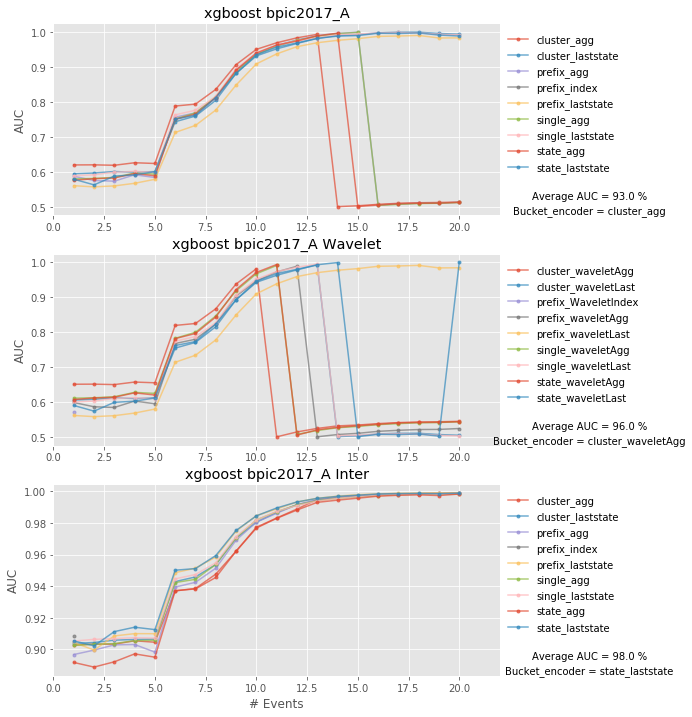


Data: bpic2012_D, and clf: xgboost
76.0


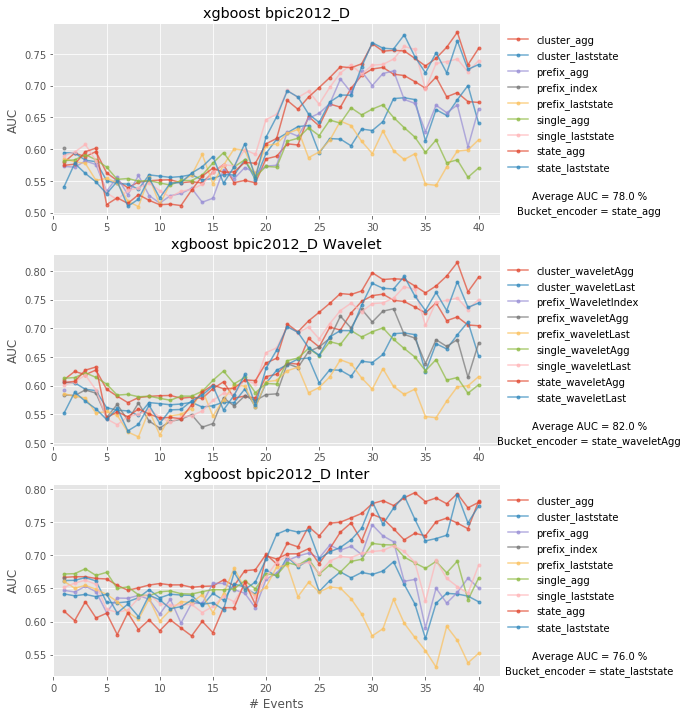


Data: bpic2017_C, and clf: rf
99.0


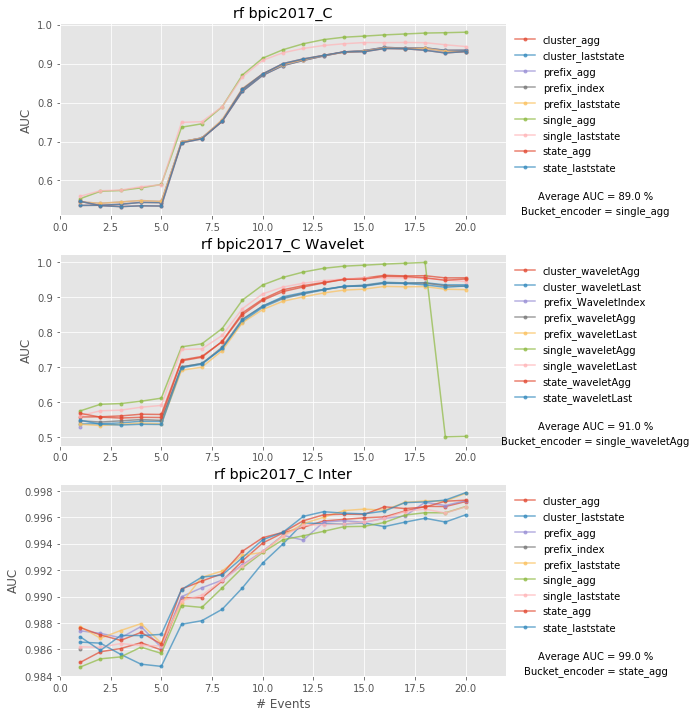


Data: sepsis_1, and clf: rf
84.0


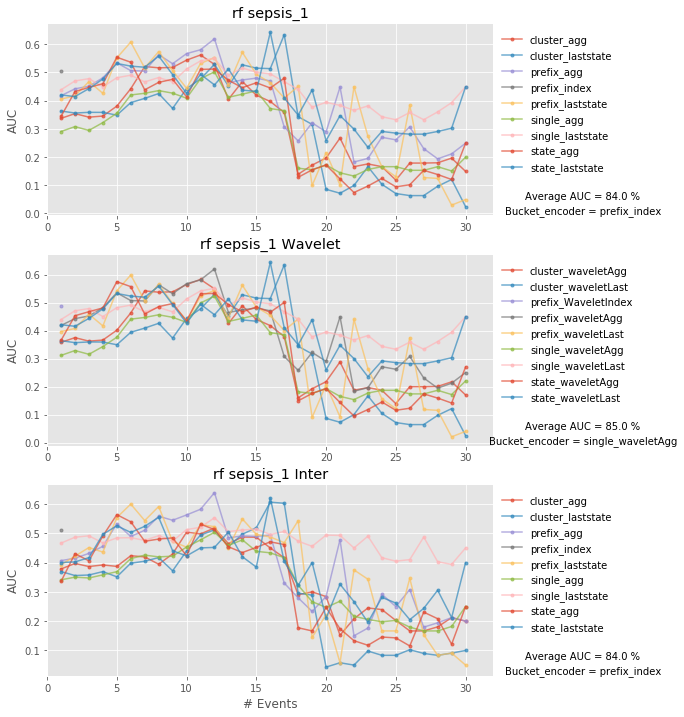


Data: sepsis_2, and clf: rf
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

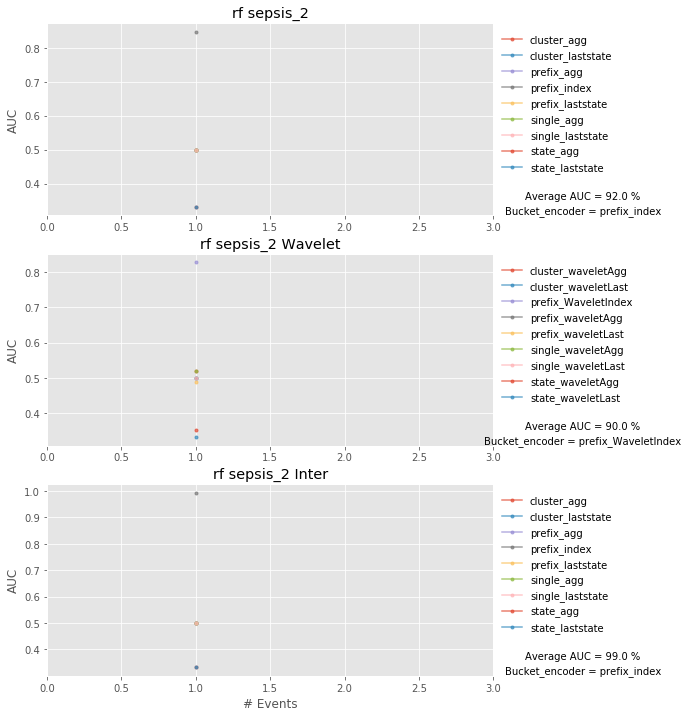


Data: sepsis_3, and clf: rf
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

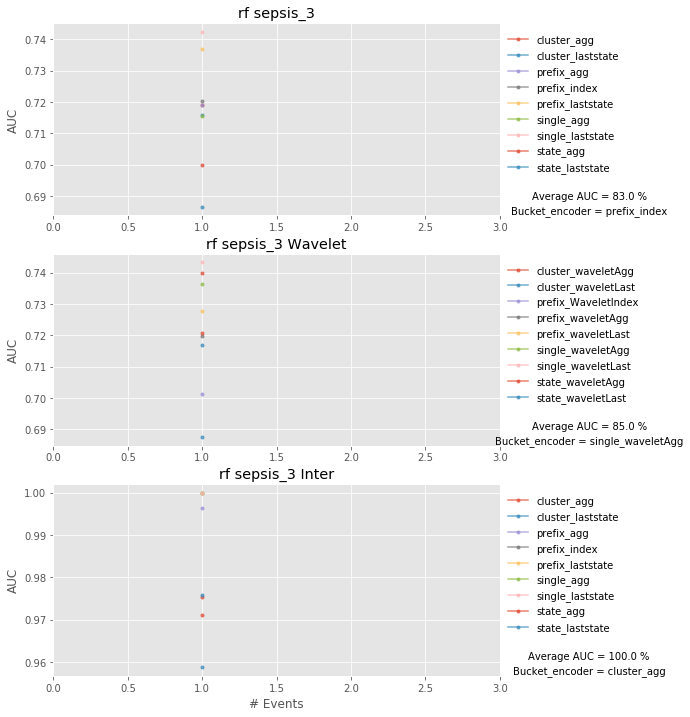


Data: bpic2012_A, and clf: rf
85.0


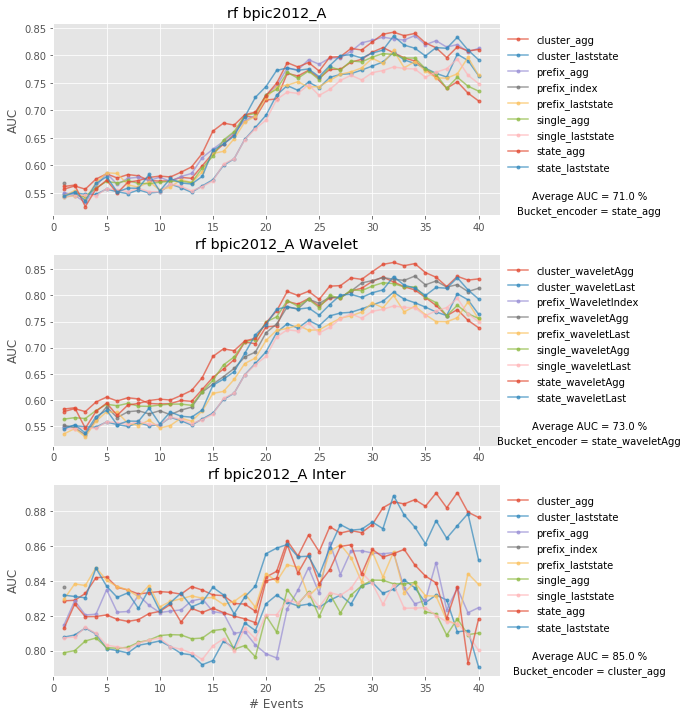


Data: bpic2017_R, and clf: rf
95.0


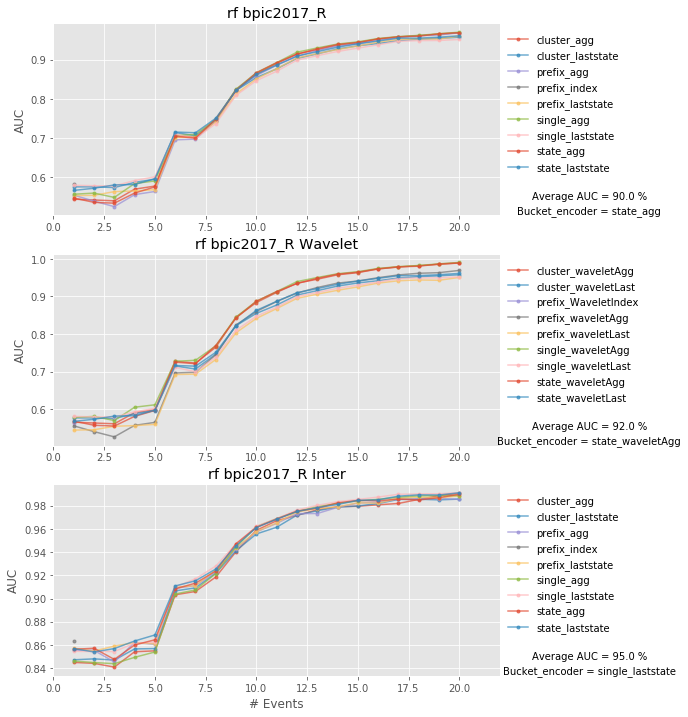


Data: production, and clf: rf
78.0


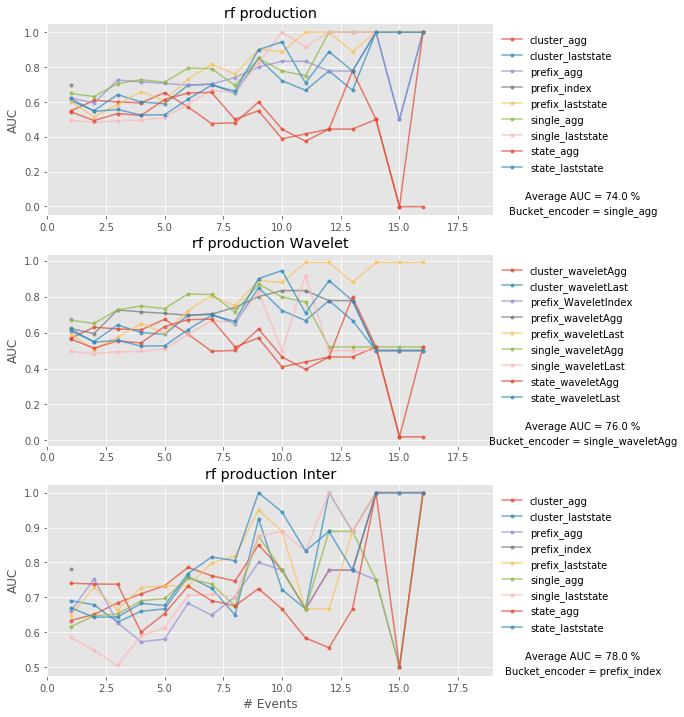


Data: bpic2011_1, and clf: rf
100.0


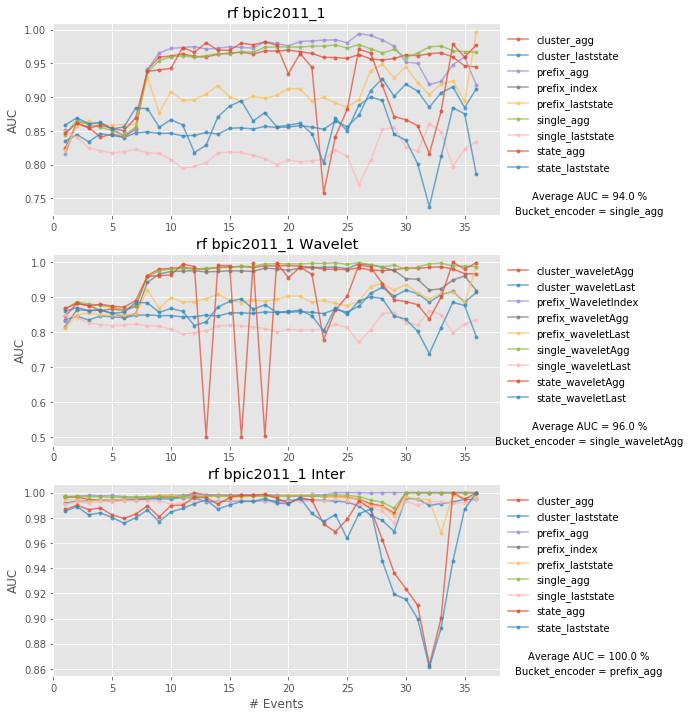


Data: bpic2011_2, and clf: rf
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

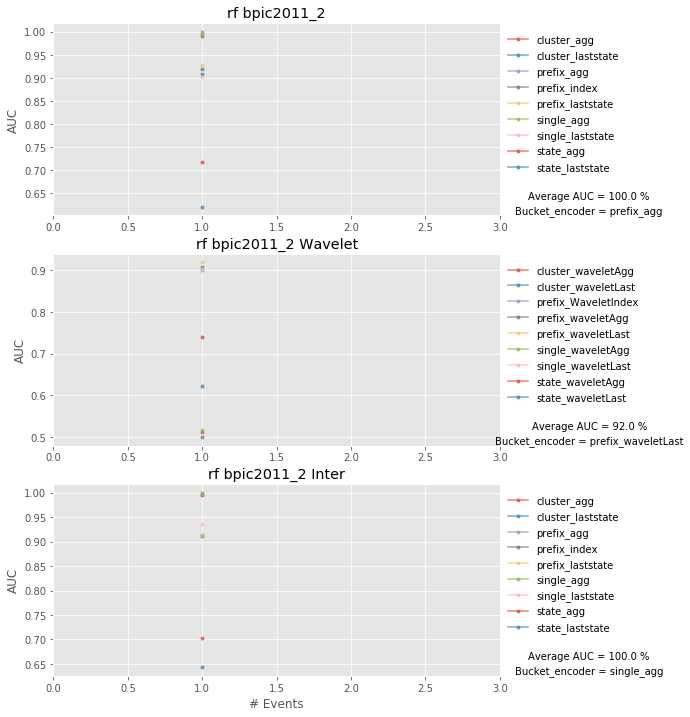


Data: bpic2011_3, and clf: rf
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

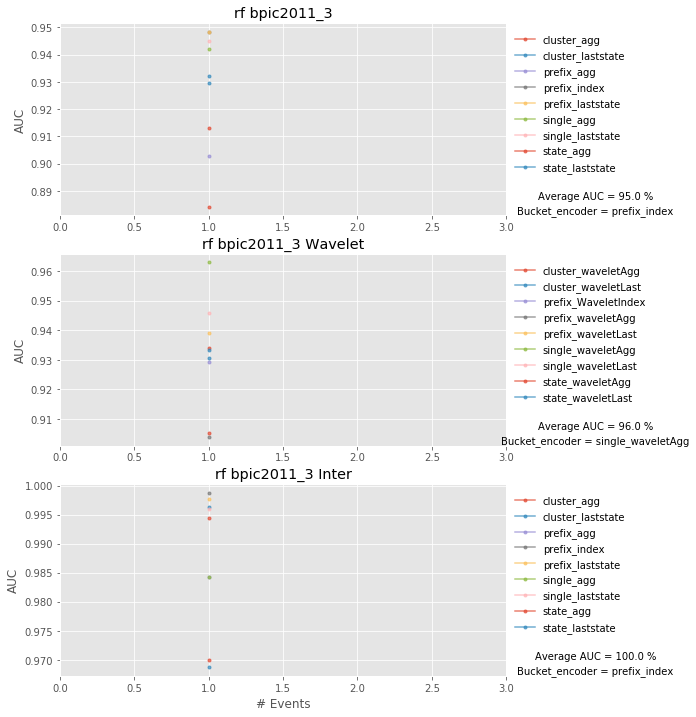


Data: bpic2011_4, and clf: rf
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

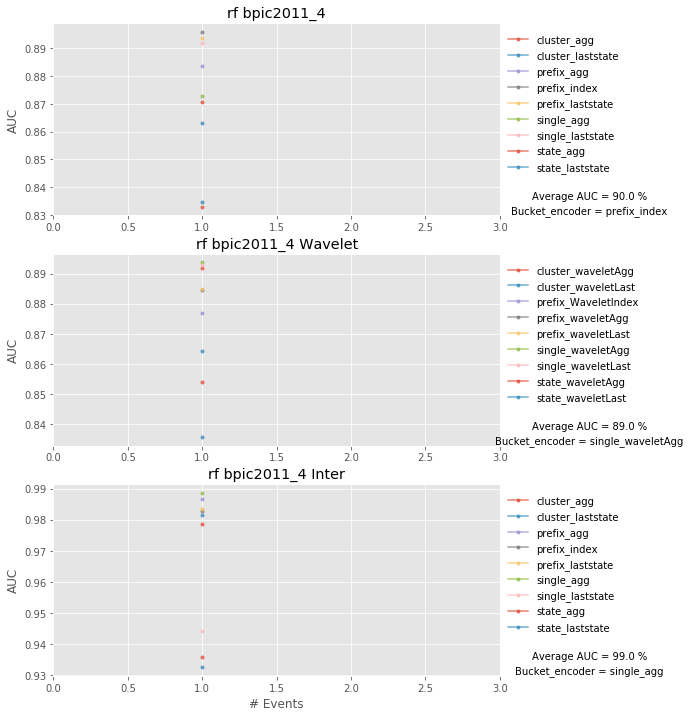


Data: bpic2012_C, and clf: rf
98.0


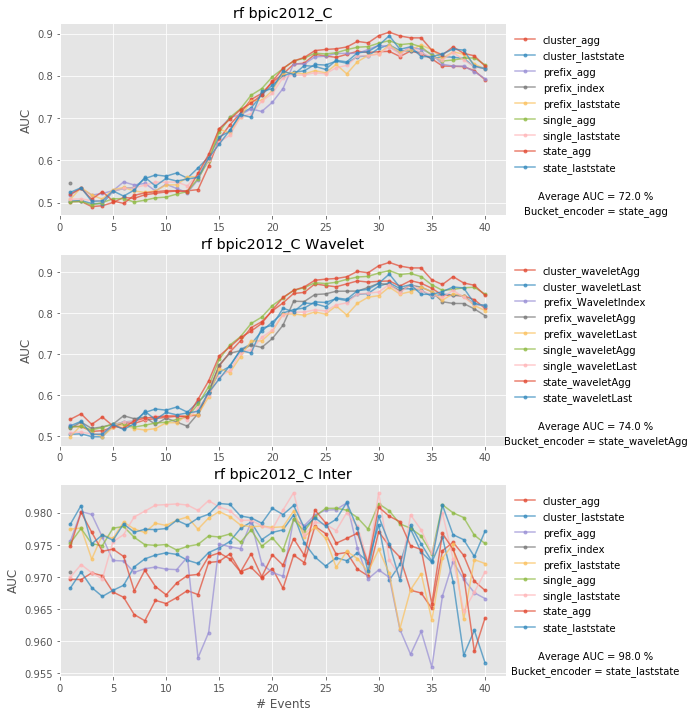


Data: bpic2015_1, and clf: rf
92.0


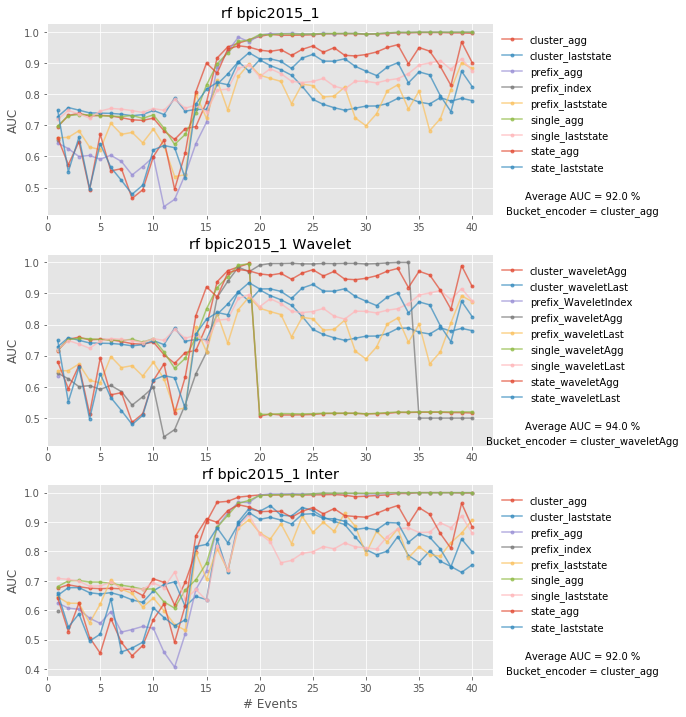


Data: bpic2015_2, and clf: rf
100.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

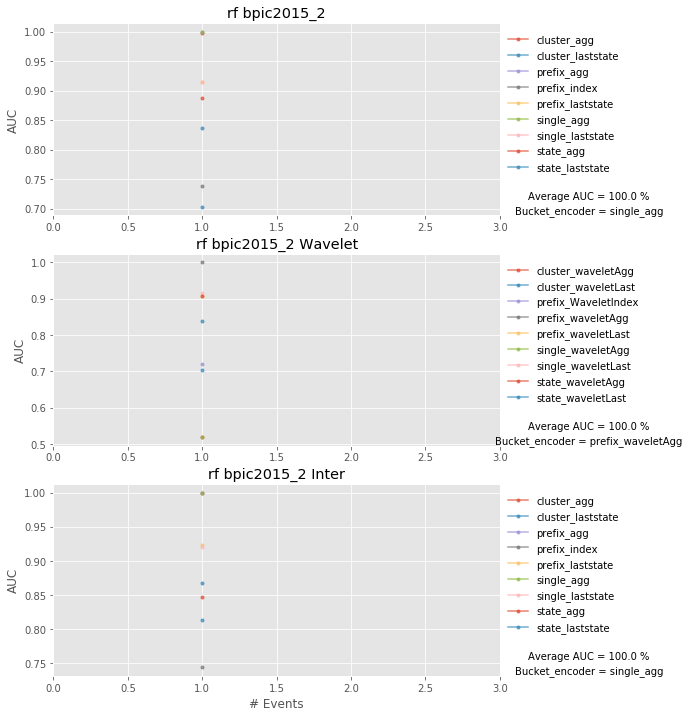


Data: bpic2015_3, and clf: rf
70.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

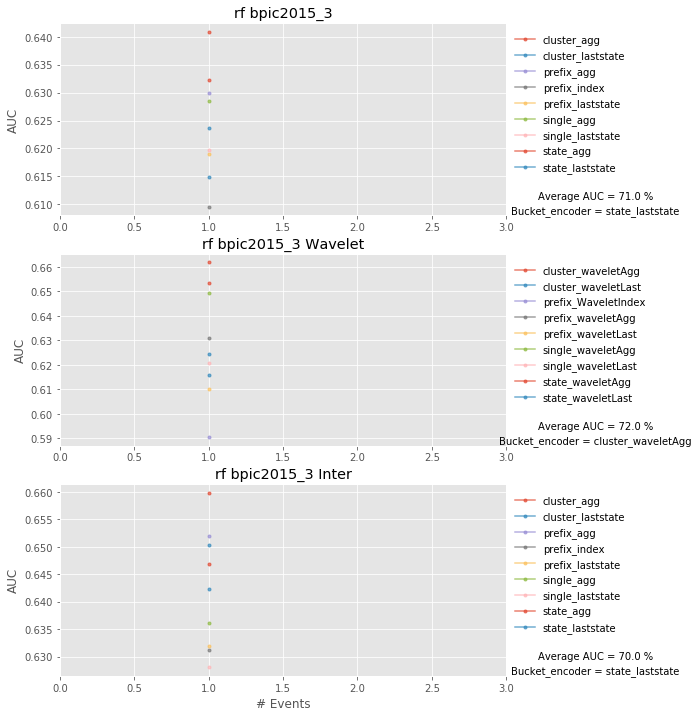


Data: bpic2015_4, and clf: rf
86.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

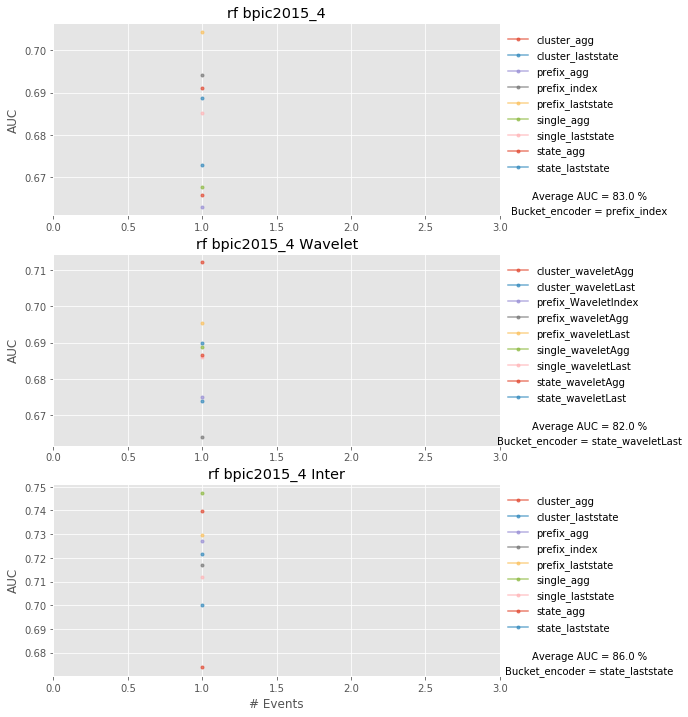


Data: bpic2015_4, and clf: rf
86.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

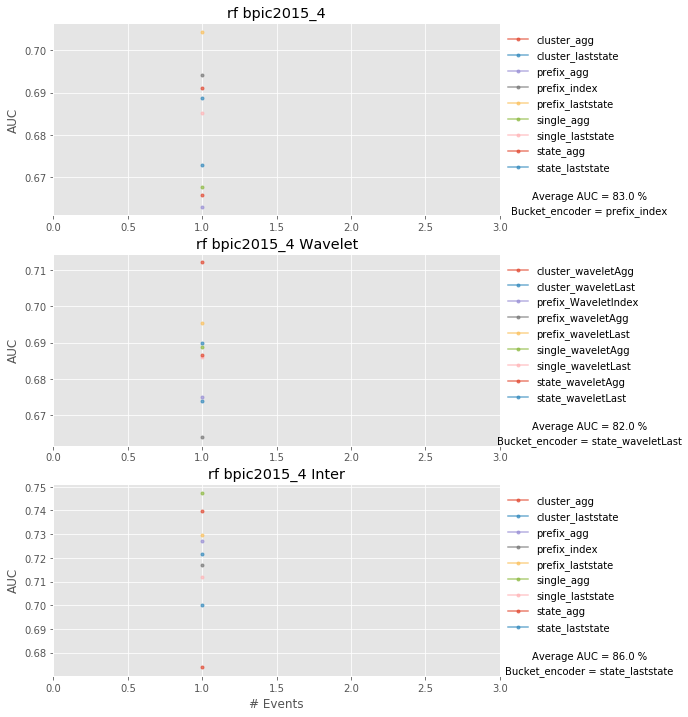


Data: bpic2017_A, and clf: rf
98.0


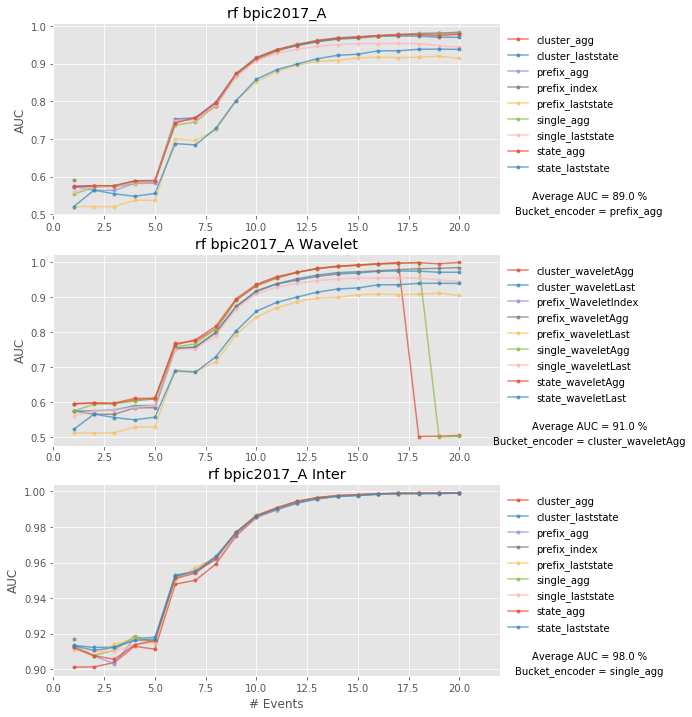


Data: bpic2012_D, and clf: rf
76.0


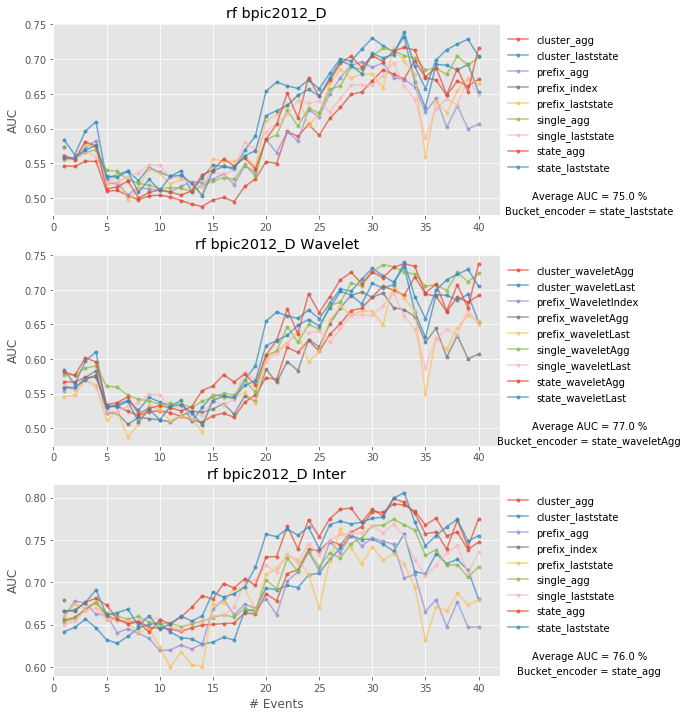


Data: bpic2017_C, and clf: logit
86.0


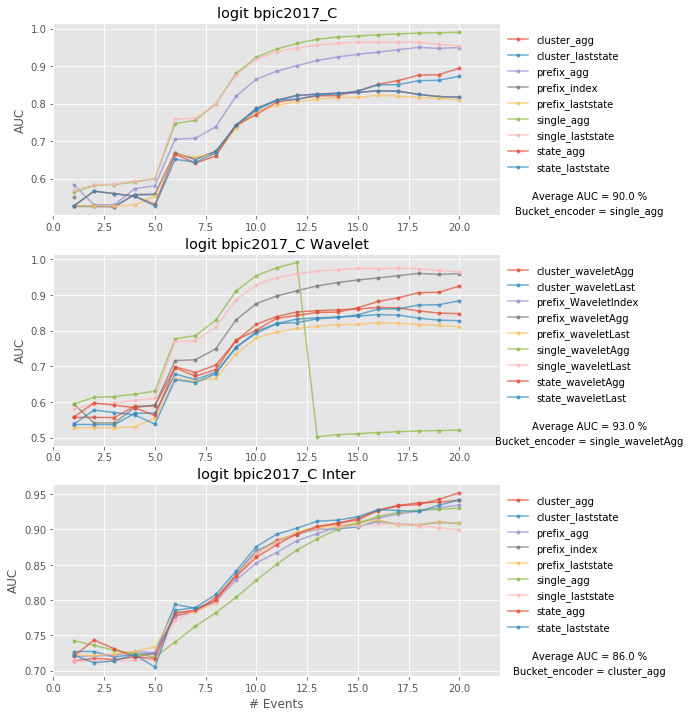


Data: sepsis_1, and clf: logit
84.0


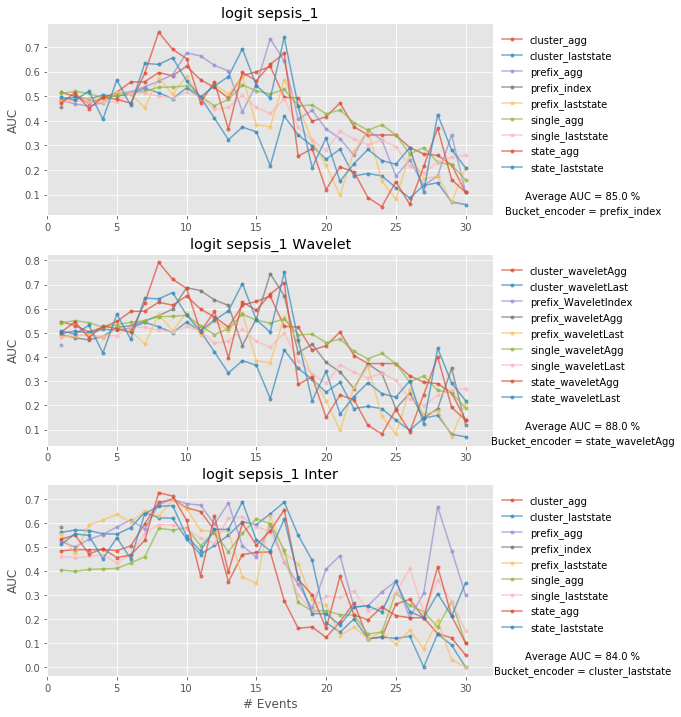


Data: sepsis_2, and clf: logit
95.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

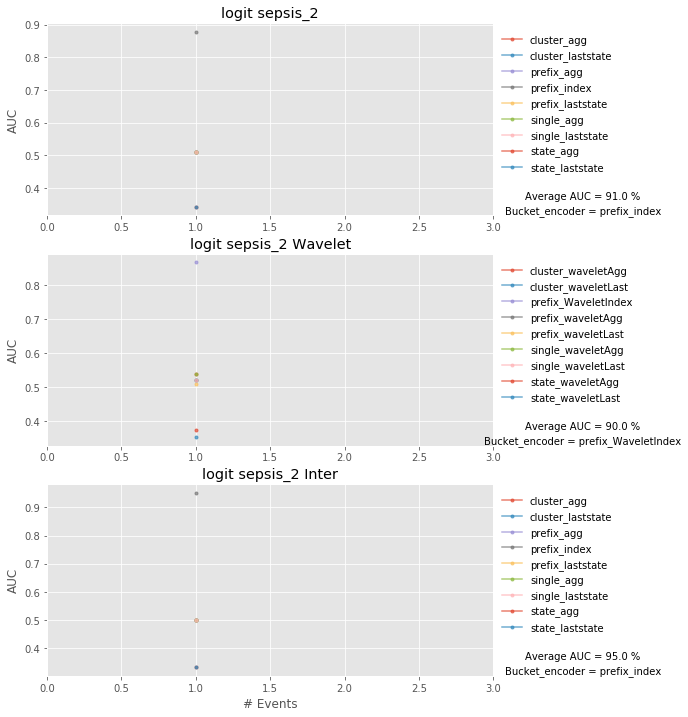


Data: sepsis_3, and clf: logit
98.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

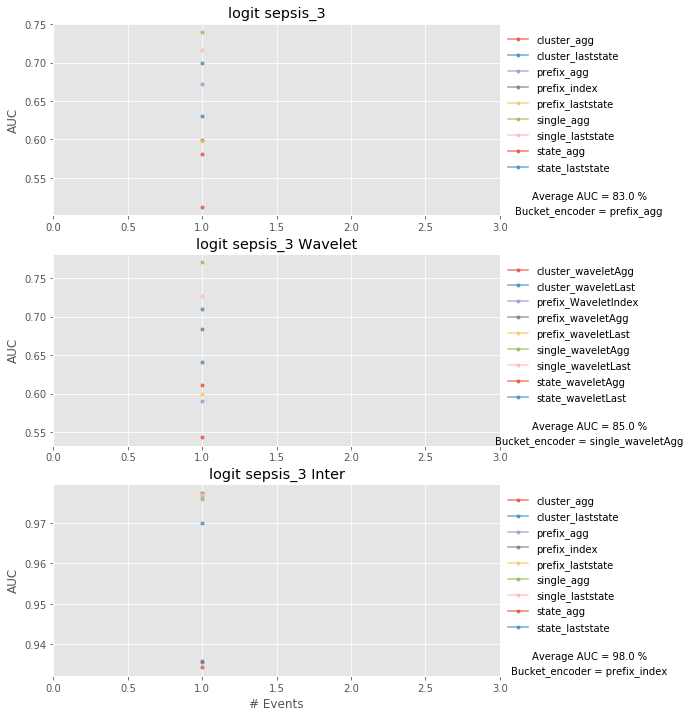


Data: bpic2012_A, and clf: logit
81.0


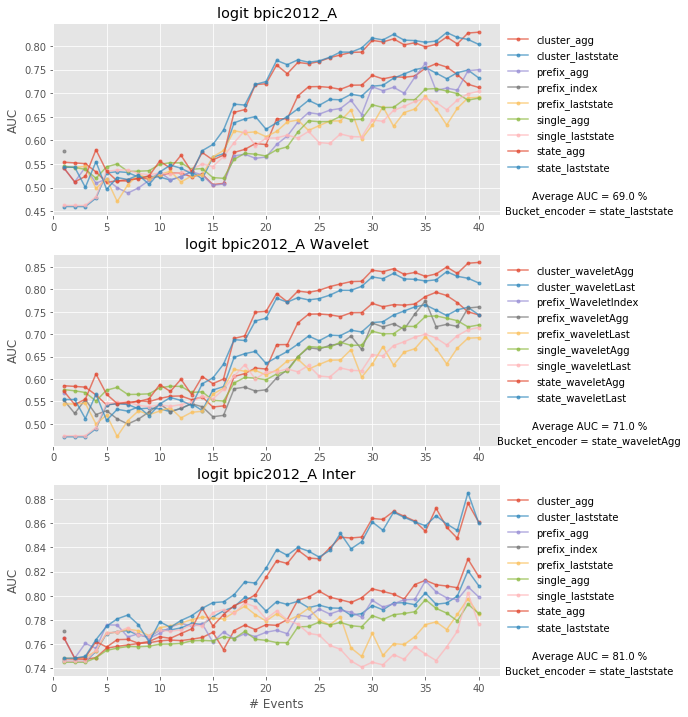


Data: bpic2017_R, and clf: logit
86.0


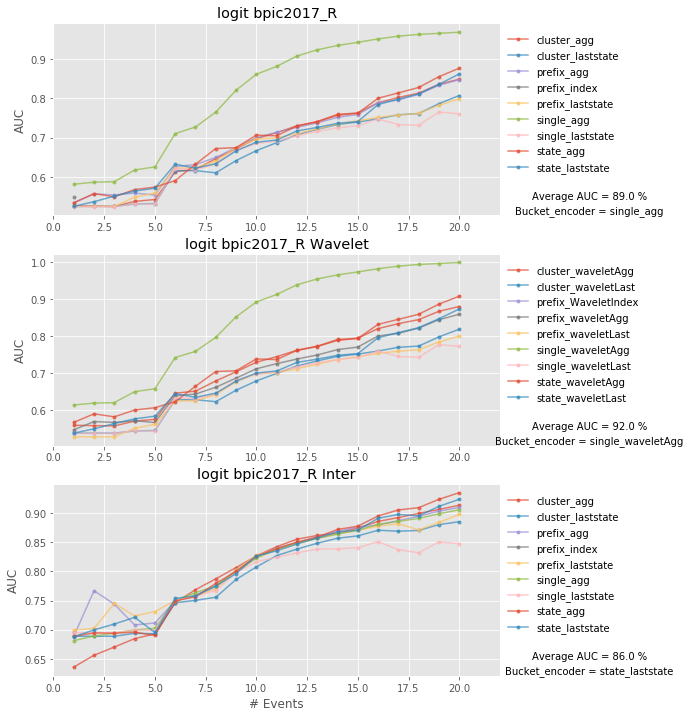


Data: production, and clf: logit
71.0


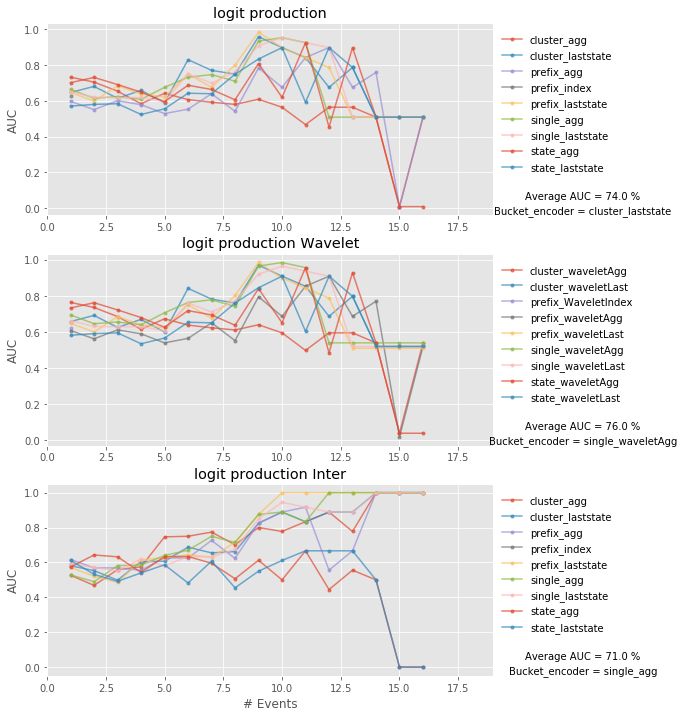


Data: bpic2011_1, and clf: logit
85.0


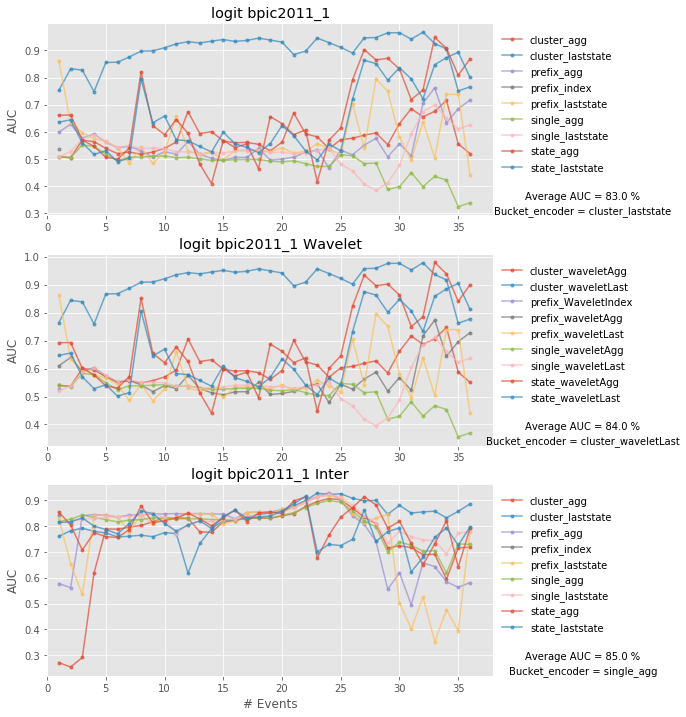


Data: bpic2011_2, and clf: logit
81.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

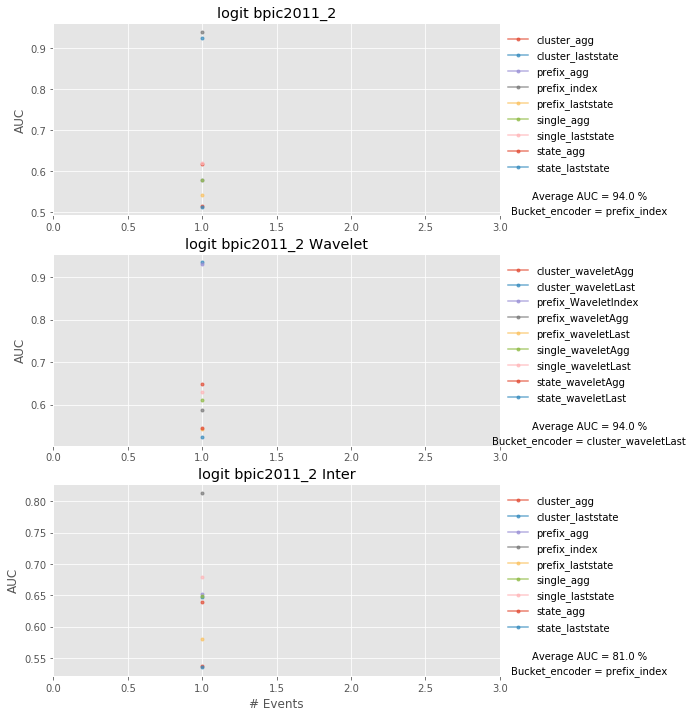


Data: bpic2011_3, and clf: logit
92.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

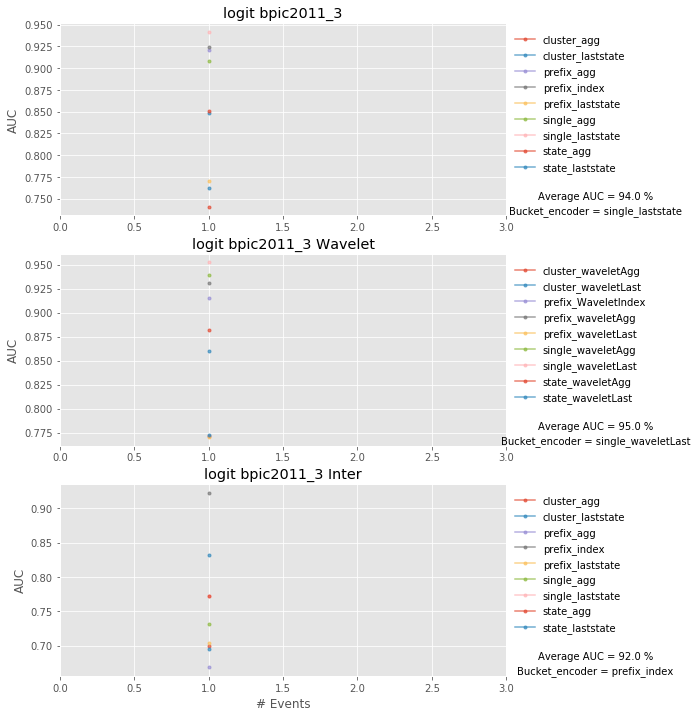


Data: bpic2011_4, and clf: logit
88.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

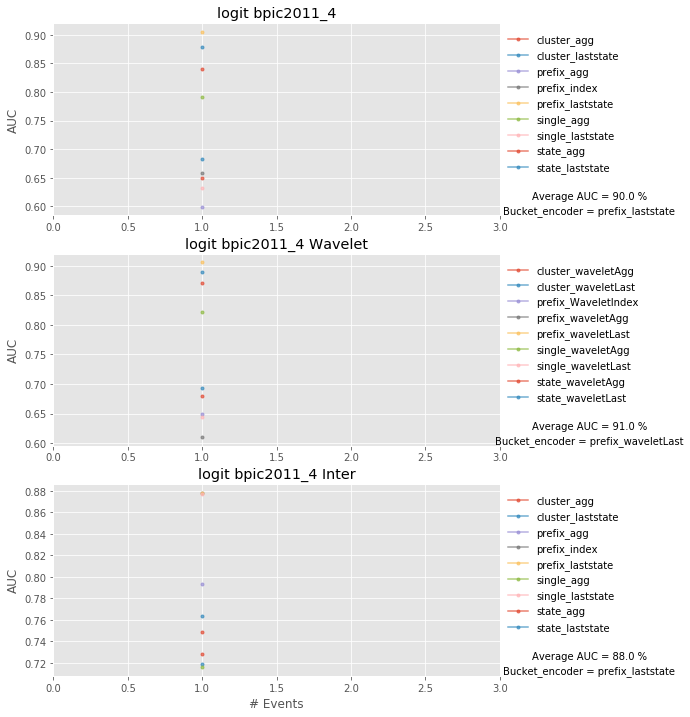


Data: bpic2012_C, and clf: logit
93.0


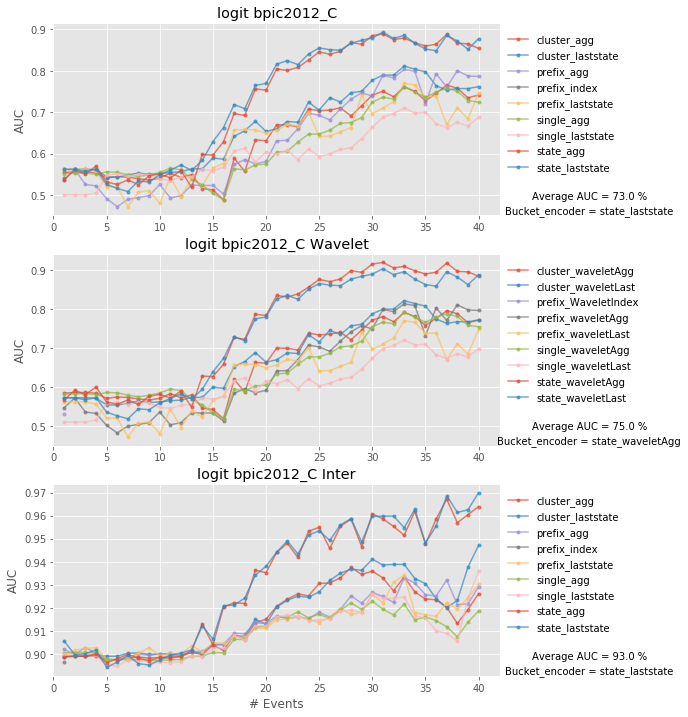


Data: bpic2015_1, and clf: logit
76.0


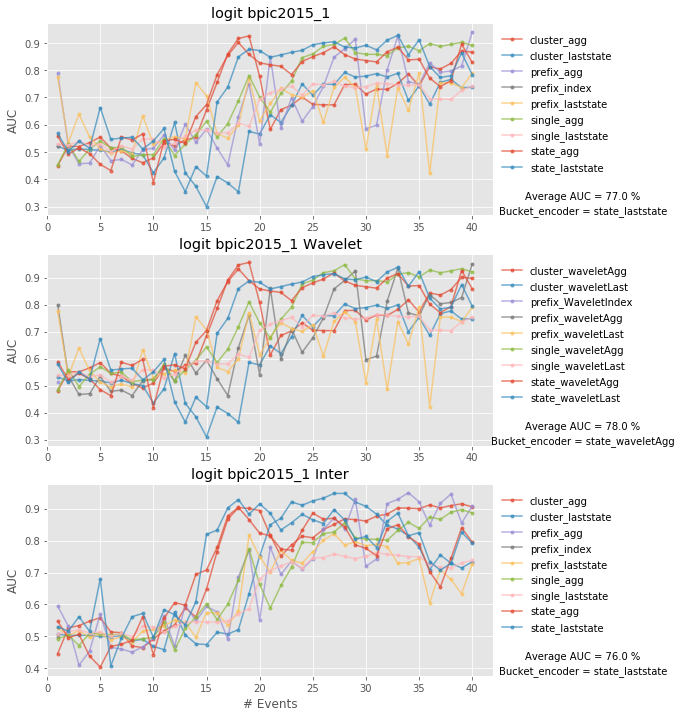


Data: bpic2015_2, and clf: logit
87.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

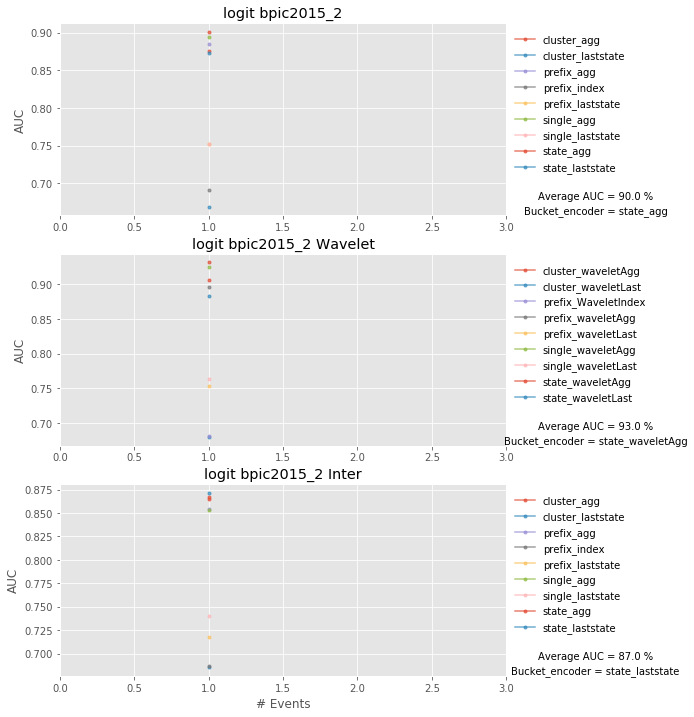


Data: bpic2015_3, and clf: logit
69.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

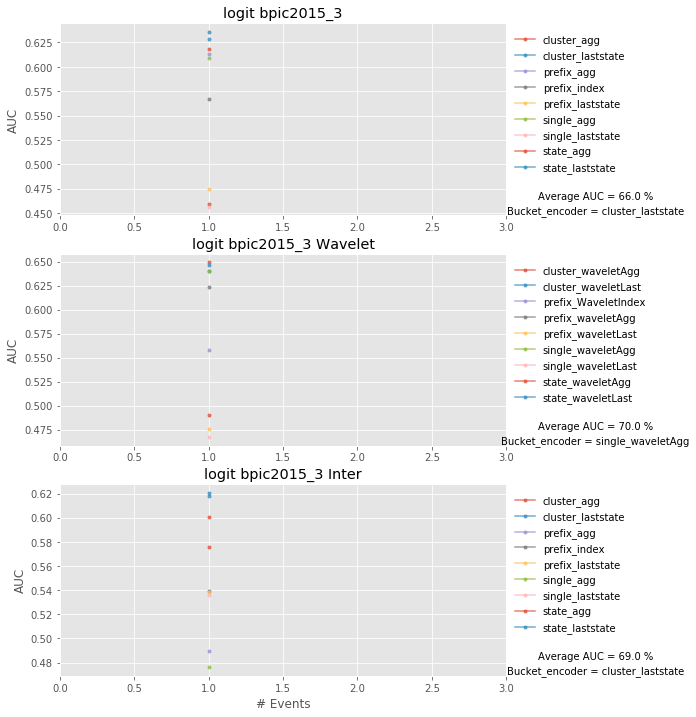


Data: bpic2015_4, and clf: logit
81.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

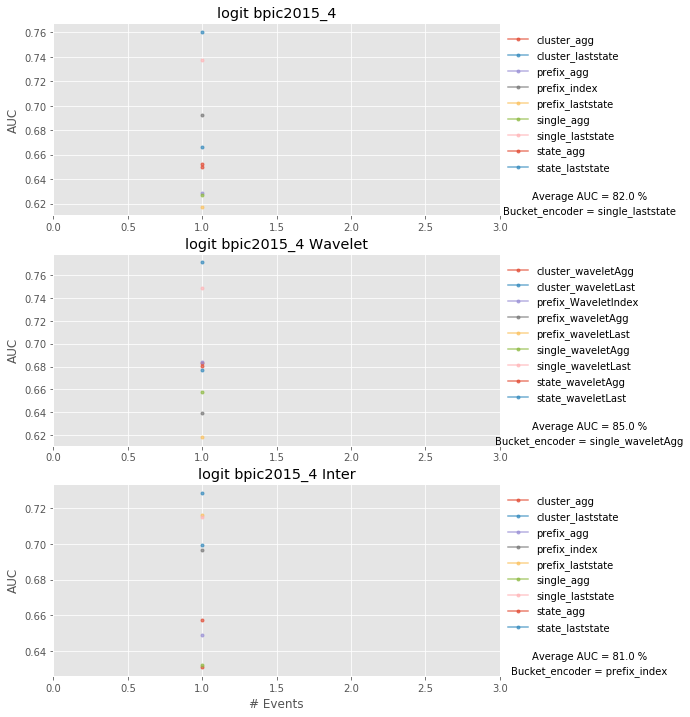


Data: bpic2015_4, and clf: logit
81.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

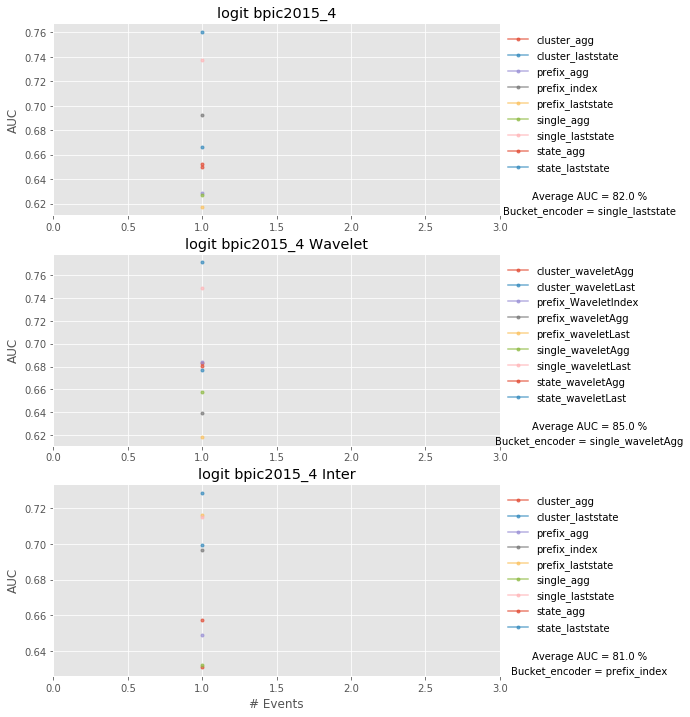


Data: bpic2017_A, and clf: logit
86.0


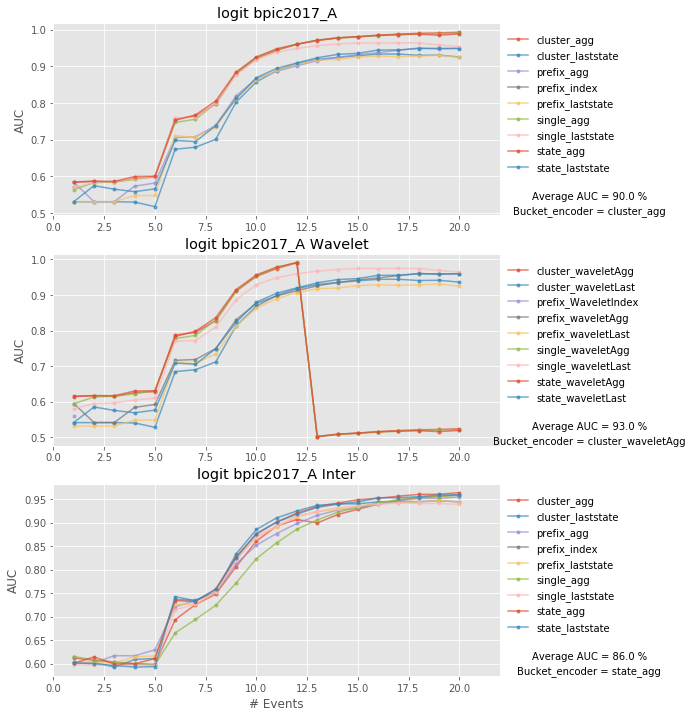


Data: bpic2012_D, and clf: logit
75.0


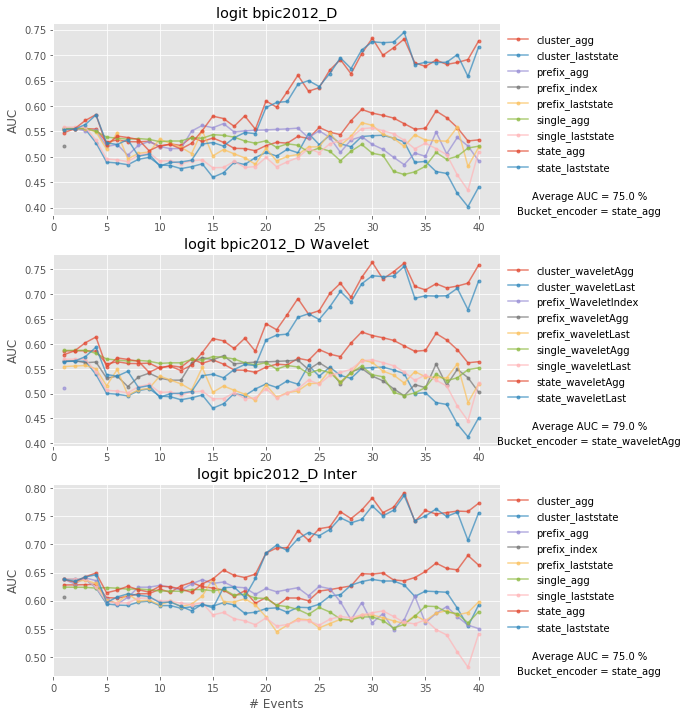


Data: bpic2017_C, and clf: svm
97.0


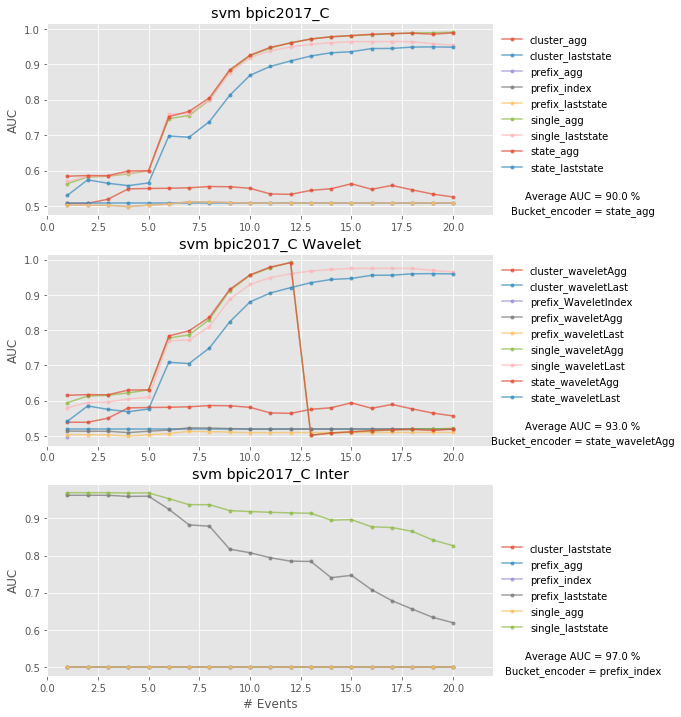


Data: sepsis_1, and clf: svm
61.0


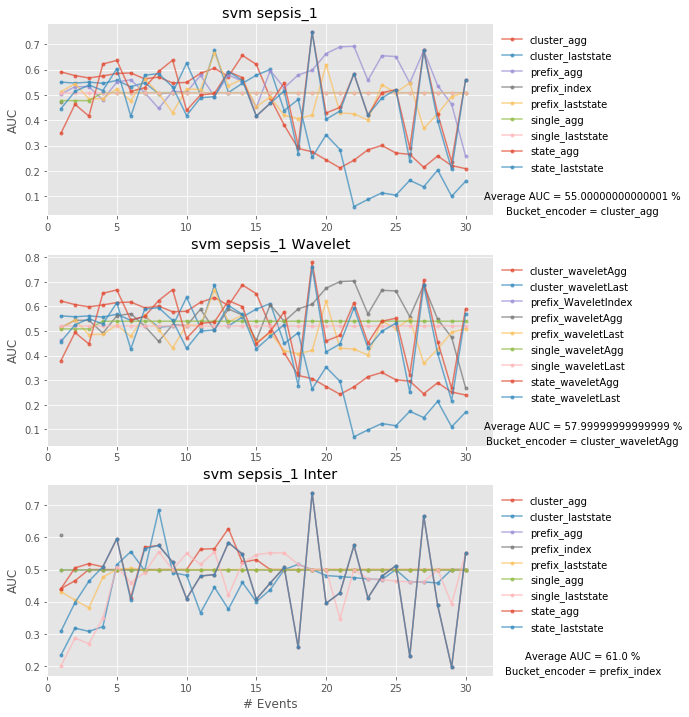


Data: sepsis_2, and clf: svm
64.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

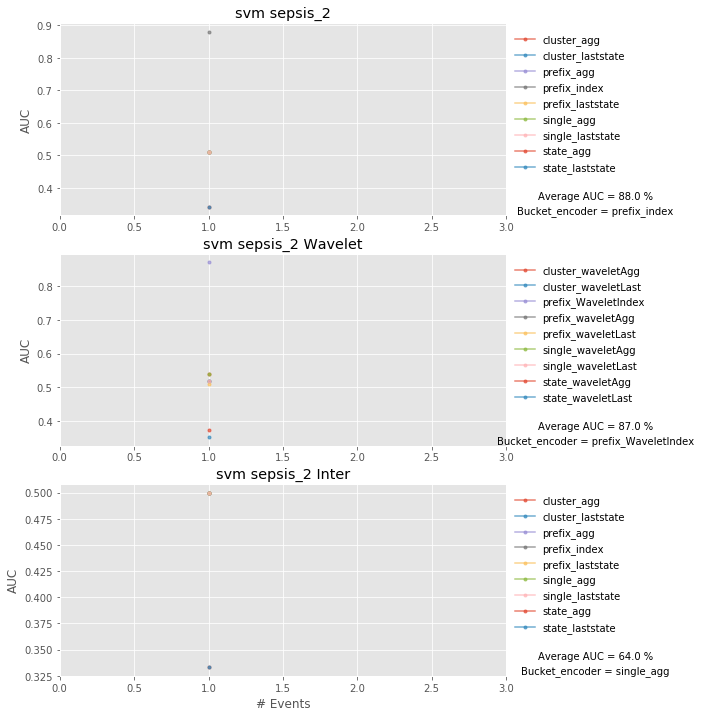


Data: sepsis_3, and clf: svm
99.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

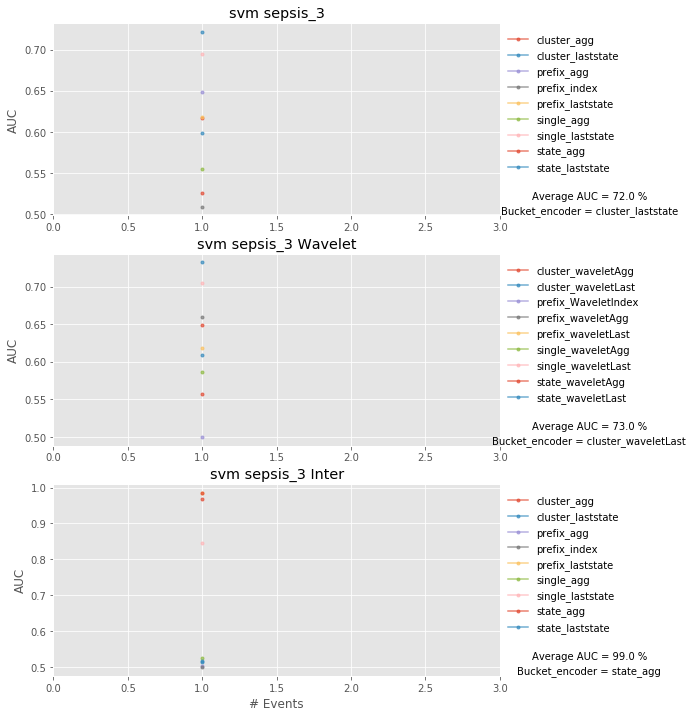


Data: bpic2012_A, and clf: svm
67.0


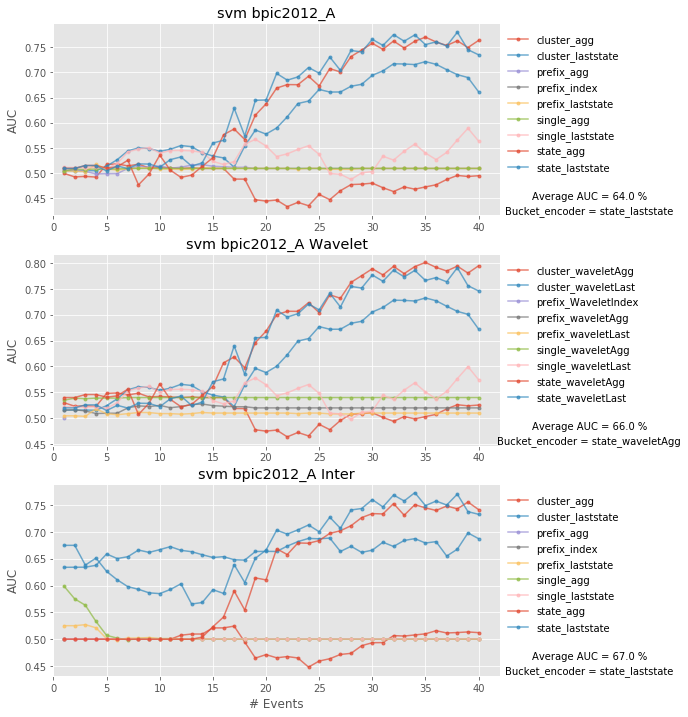


Data: bpic2017_R, and clf: svm
53.0


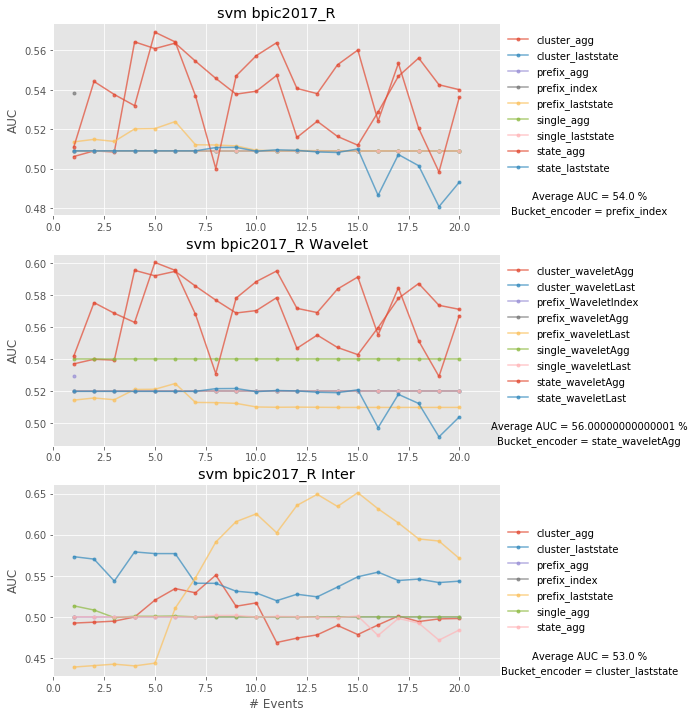


Data: production, and clf: svm
64.0


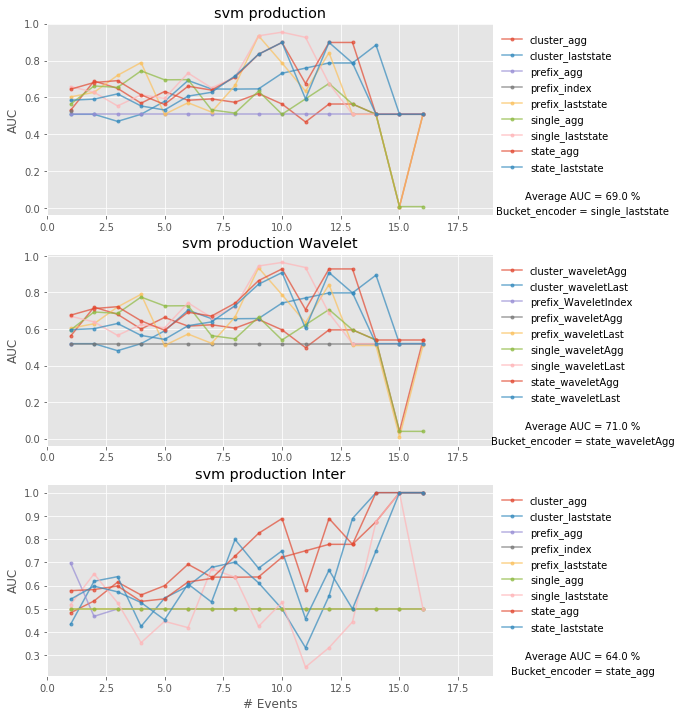


Data: bpic2011_1, and clf: svm
91.0


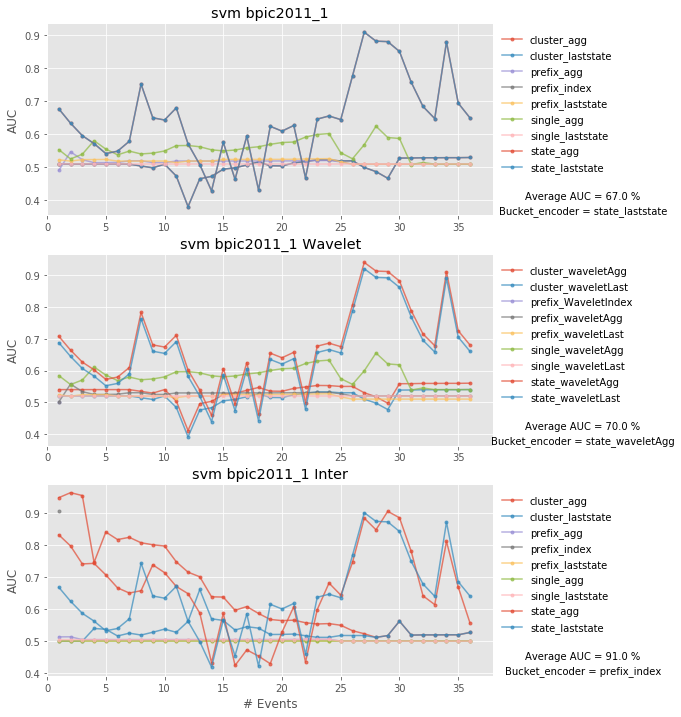


Data: bpic2011_2, and clf: svm
56.00000000000001


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

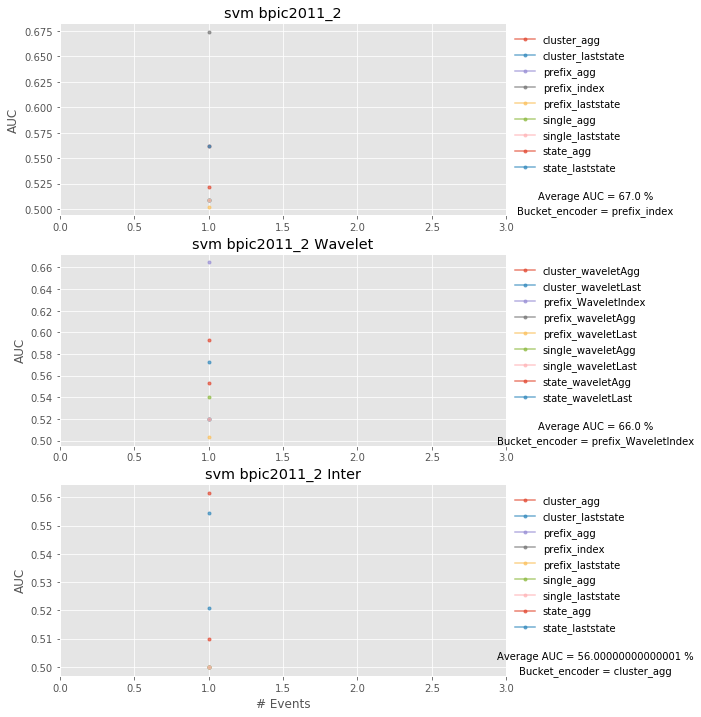


Data: bpic2011_3, and clf: svm
91.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

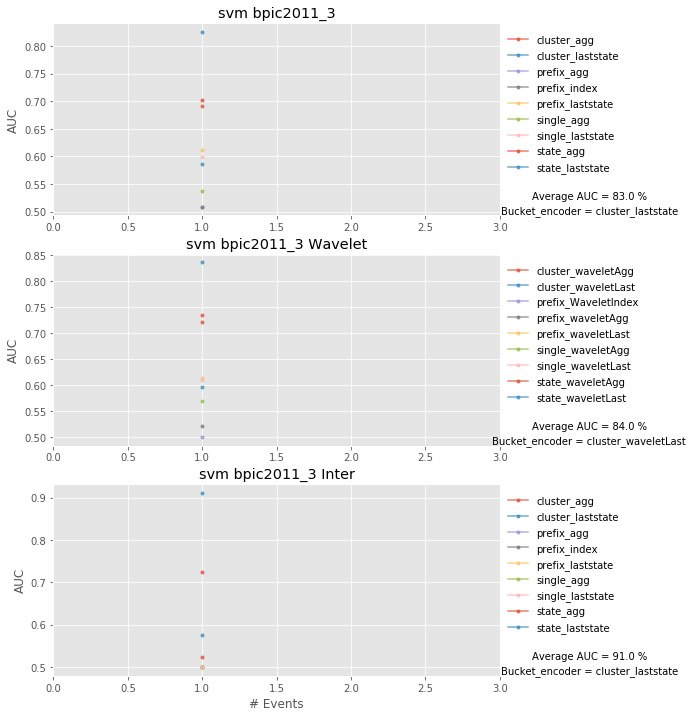


Data: bpic2011_4, and clf: svm
88.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

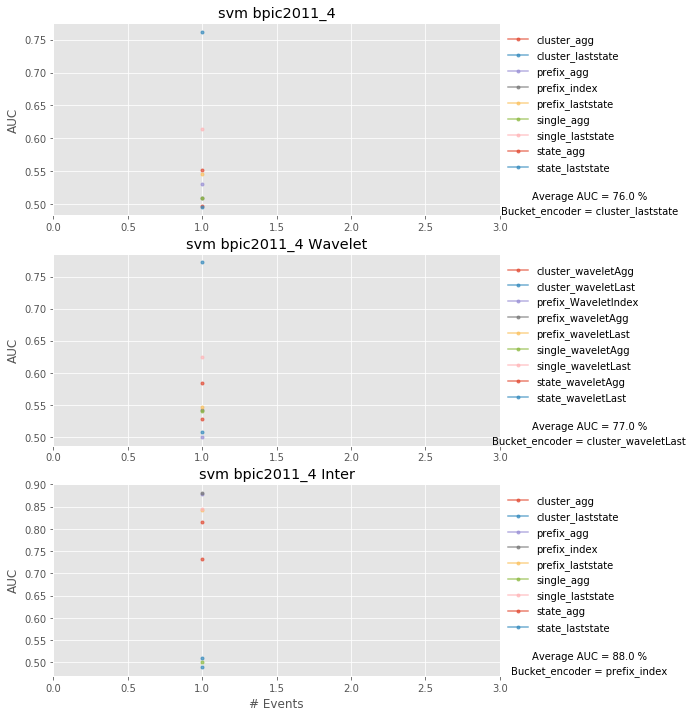


Data: bpic2012_C, and clf: svm
79.0


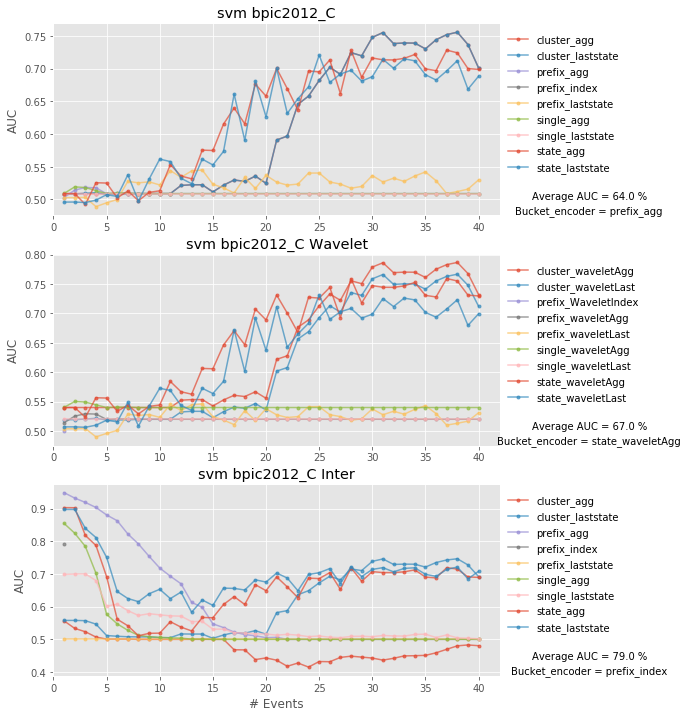


Data: bpic2015_1, and clf: svm
67.0


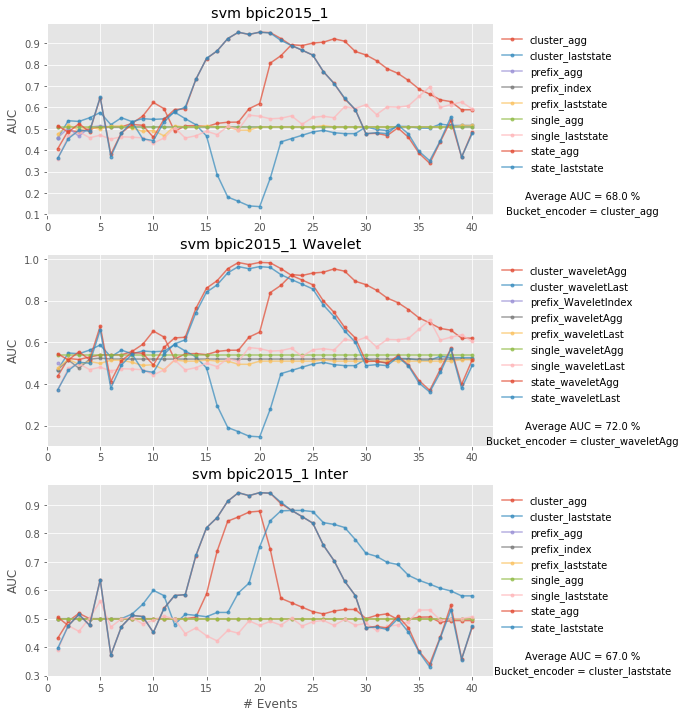


Data: bpic2015_2, and clf: svm
79.0


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

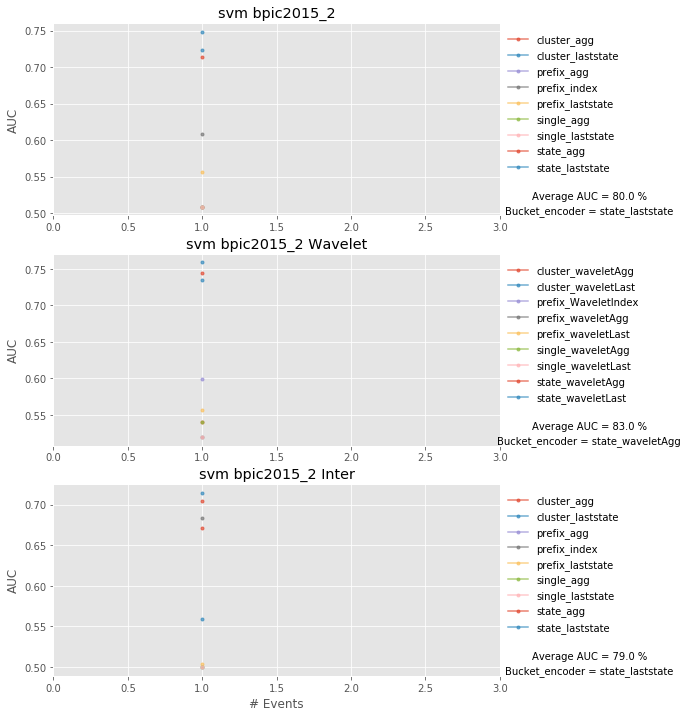


Data: bpic2015_3, and clf: svm
56.00000000000001


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

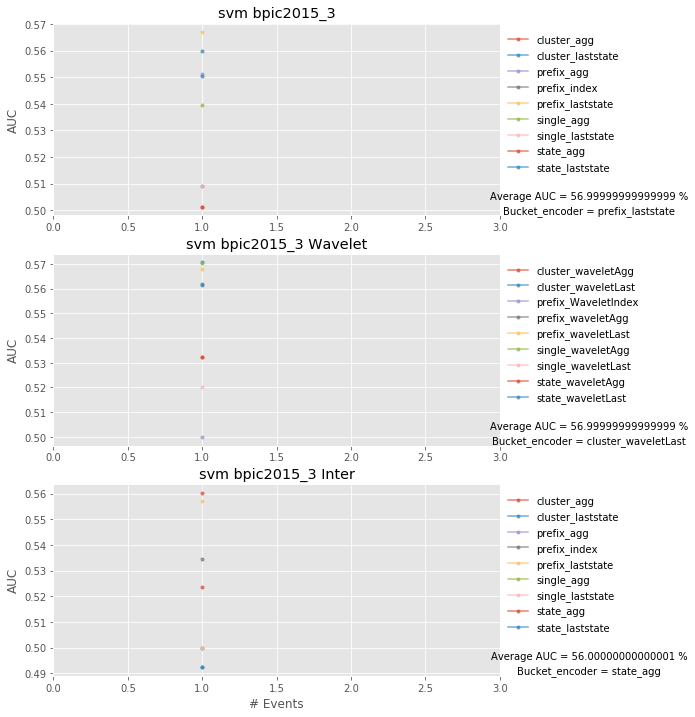


Data: bpic2015_4, and clf: svm
57.99999999999999


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

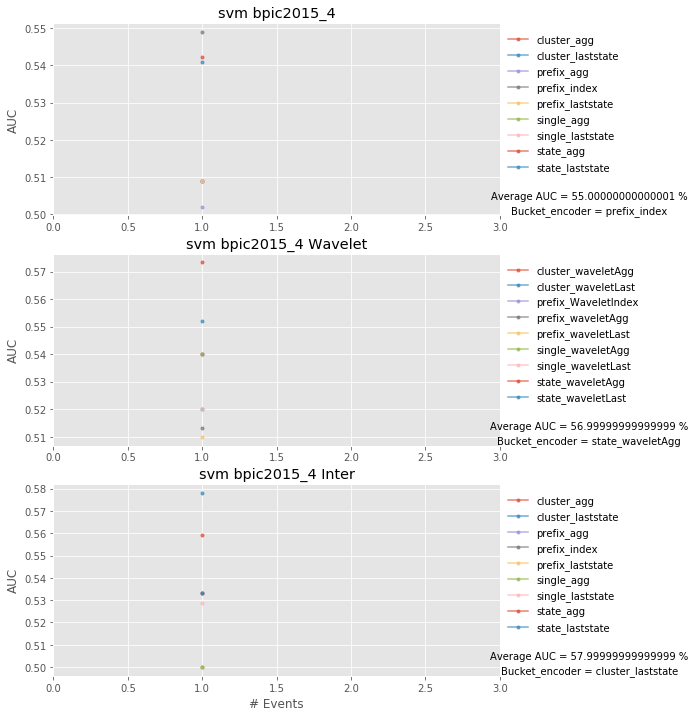


Data: bpic2015_4, and clf: svm
57.99999999999999


/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
/home/kamel/anaconda3/envs/master_env/lib/python3.6/site-packages/pandas/plotting/_matplotlib/core.py:1085: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically ex

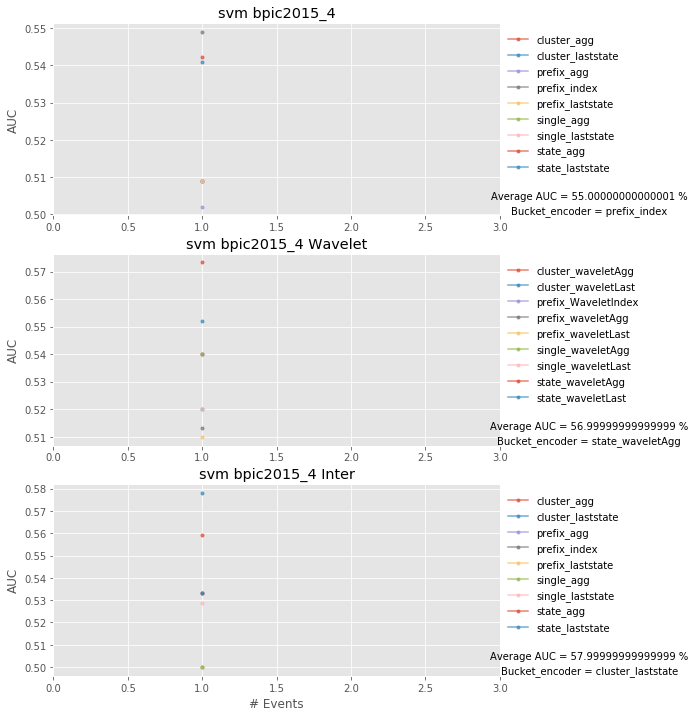


Data: bpic2017_A, and clf: svm
56.99999999999999


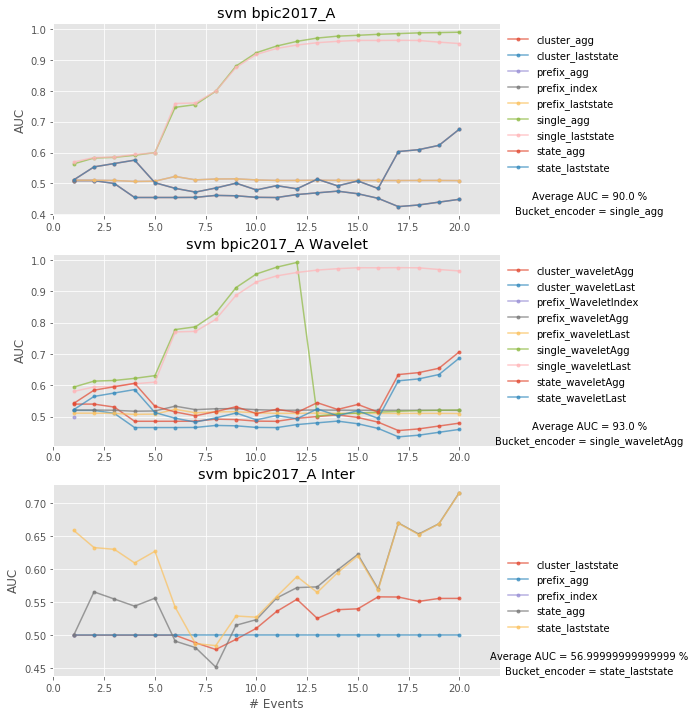


Data: bpic2012_D, and clf: svm
55.00000000000001


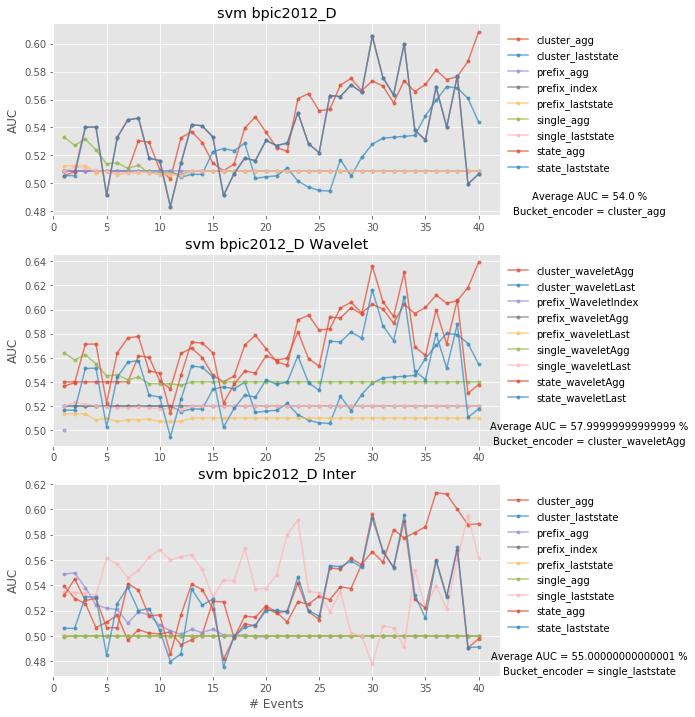

In [173]:
for cls in ['catboost', 'xgboost', 'rf', 'logit', 'svm']:
    out = plot_results_wavlet(df1, df2,df3, result_df,cls) # compare results from all contributions
    All_Results = pd.concat([All_Results, out], axis=0)

#All_Results

In [174]:
# results for all contributions
All_Results

,dataset,cls,auc,wavelet_auc,inter_auc
0,bpic2017_C,catboost,92.0,91.0,99.0
1,sepsis_1,catboost,91.0,90.0,84.0
2,sepsis_2,catboost,97.0,92.0,100.0
3,sepsis_3,catboost,90.0,88.0,100.0
4,bpic2012_A,catboost,74.0,73.0,83.0
...,...,...,...,...,...
14,bpic2015_3,svm,57.0,57.0,56.0
15,bpic2015_4,svm,55.0,57.0,58.0
16,bpic2015_4,svm,55.0,57.0,58.0
17,bpic2017_A,svm,90.0,93.0,57.0


In [175]:
c_auc = 0
c_w_auc = 0
c_i_auc = 0
gro = All_Results.groupby('cls')
for name, g in gro:
    print(name)
    out = g
    c_auc = 0
    c_w_auc = 0
    c_i_auc = 0
    for i in out.iterrows():
        auc = list(i)[1][2] # Contribution 1: CatBoost


        w_auc = list(i)[1][3] # Contribution 2: Wavelet


        i_auc = list(i)[1][4] # Contribution 3: Inter-case features


        if (auc >= w_auc) and (auc >= i_auc):
            largest = auc
            name = "auc"
            c_auc+=1
        elif (w_auc >= auc) and (w_auc >= i_auc):
            largest = w_auc
            name="w_auc"
            c_w_auc+=1
        else:       
            largest = i_auc
            name="i_auc"
            c_i_auc+=1


    print(f"auc: {c_auc}, w_auc: {c_w_auc}, and i_auc: {c_i_auc}\n")


catboost
auc: 10, w_auc: 1, and i_auc: 8

logit
auc: 1, w_auc: 13, and i_auc: 5

rf
auc: 2, w_auc: 4, and i_auc: 13

svm
auc: 3, w_auc: 6, and i_auc: 10

xgboost
auc: 3, w_auc: 5, and i_auc: 11



# Plot Time

In [205]:
plt.rcParams["figure.figsize"] = (10,8)
def plot_time(file):
    df_cat_time = file
    datasets = list(set(df_cat_time['dataset']))
    for data in datasets:
        

        tr_cat = df_cat_time[(df_cat_time['dataset']==data) 
                & (df_cat_time['metric']=='offline_total_avg') # change for online time
               & (df_cat_time['cls']=='catboost')].drop_duplicates()
        #tr_cat

        tr_xgb = df_cat_time[(df_cat_time['dataset']==data) 
                & (df_cat_time['metric']=='offline_total_avg') # change for online time
               & (df_cat_time['cls']=='xgboost')].drop_duplicates()
        #tr_rf
        
        tr_rf = df_cat_time[(df_cat_time['dataset']==data) 
                & (df_cat_time['metric']=='offline_total_avg') # change for online time
               & (df_cat_time['cls']=='rf')].drop_duplicates()
        #tr_logit
        tr_l = df_cat_time[(df_cat_time['dataset']==data) 
                & (df_cat_time['metric']=='offline_total_avg') # change for online time
               & (df_cat_time['cls']=='logit')].drop_duplicates()
        #tr_svm
        tr_s = df_cat_time[(df_cat_time['dataset']==data) 
                & (df_cat_time['metric']=='offline_total_avg') # change for online time
               & (df_cat_time['cls']=='svm')].drop_duplicates()

        tr_cat['Method']="CatBoost"
        tr_xgb['Method']="XGBoost"
        tr_rf['Method']="RF"
        tr_l['Method'] = "Logit"
        tr_s['Method'] = "SVM"
        
        res=pd.concat([tr_cat,tr_xgb, tr_rf, tr_l, tr_s])
        sns.barplot(x='bucket_enc',y='score',data=res,hue='Method')
        plt.xticks(rotation=45, fontsize=12)
        plt.title(data)
        plt.xlabel("Bucket_Encoder")
        plt.ylabel("Time (ms)")
        plt.yscale("log")
    
        plt.savefig("./imagesTime/inter/online/"+data+".pdf",  bbox_inches='tight')

        plt.show()
        #break

    
    

In [208]:
df1 = pd.read_csv("./final_data/time/Inter_data_time_catboost.csv", sep=';')


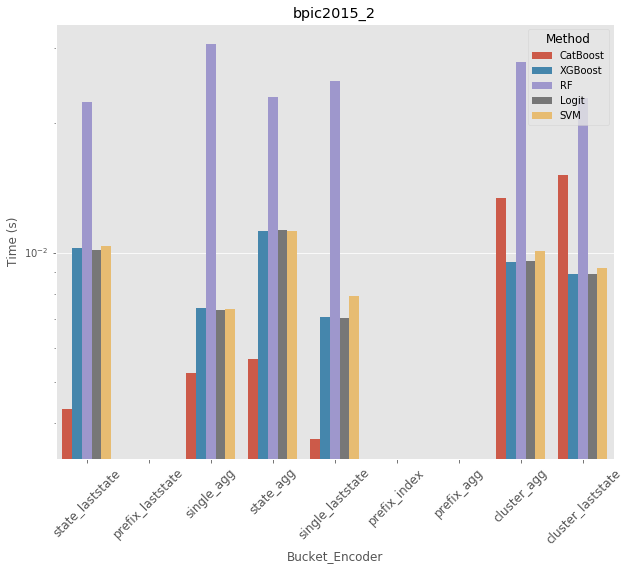

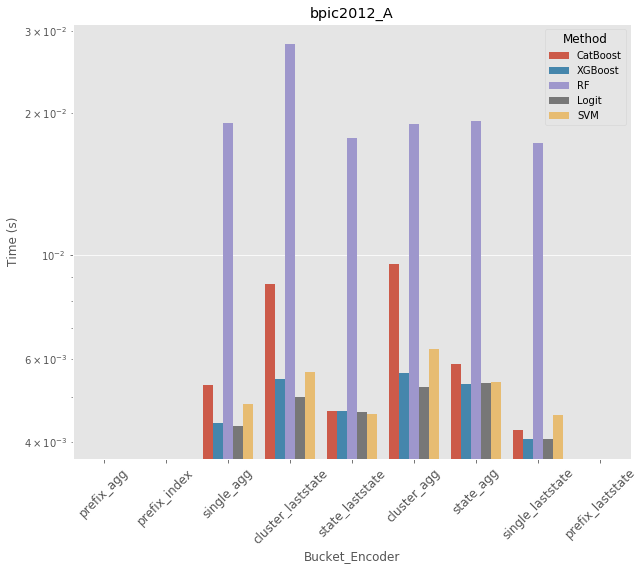

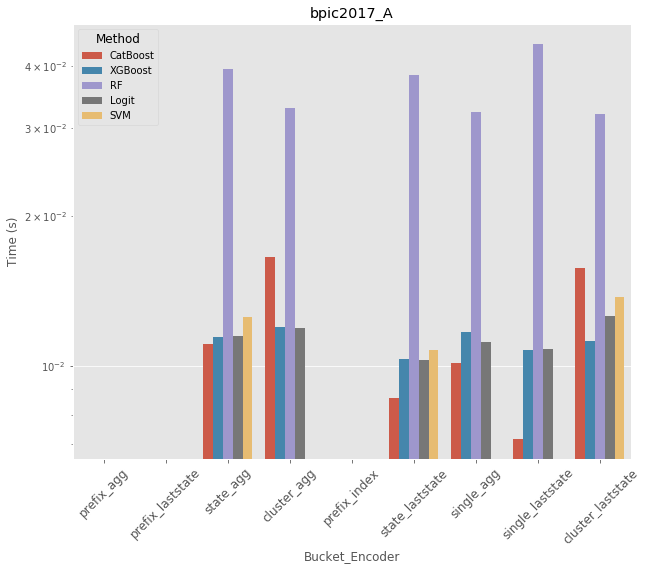

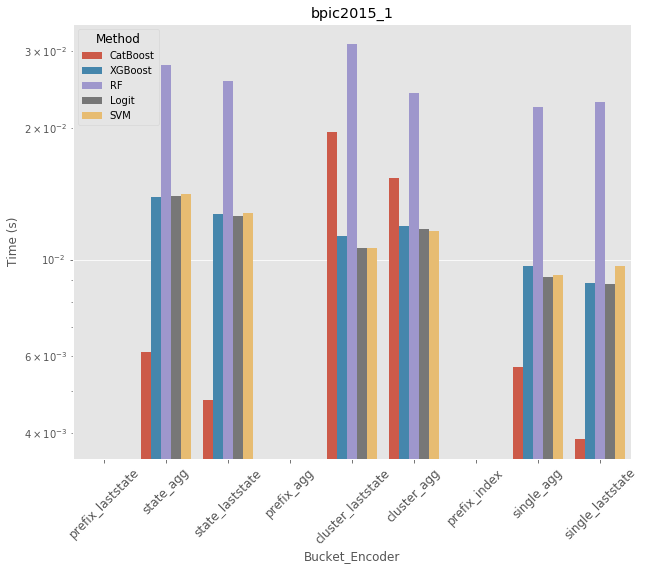

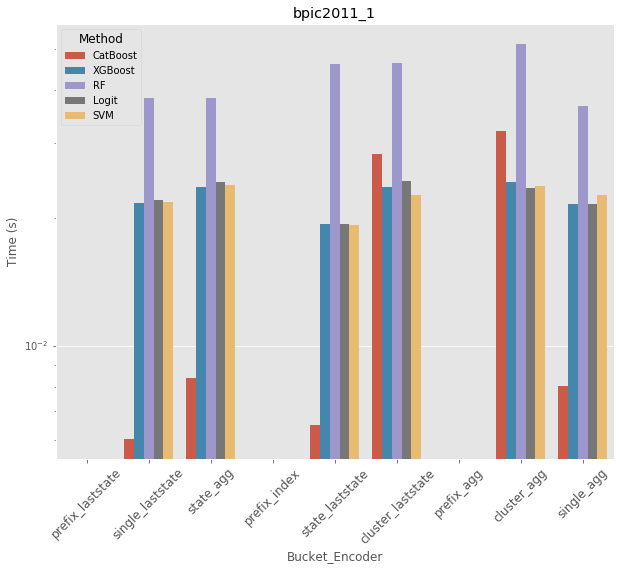

...

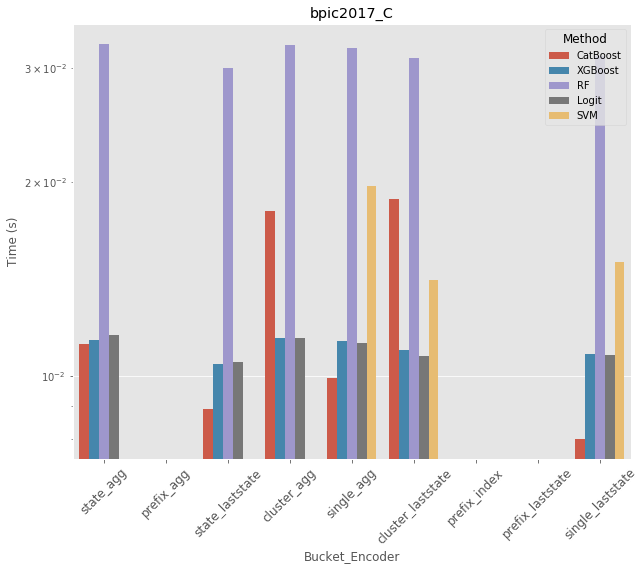

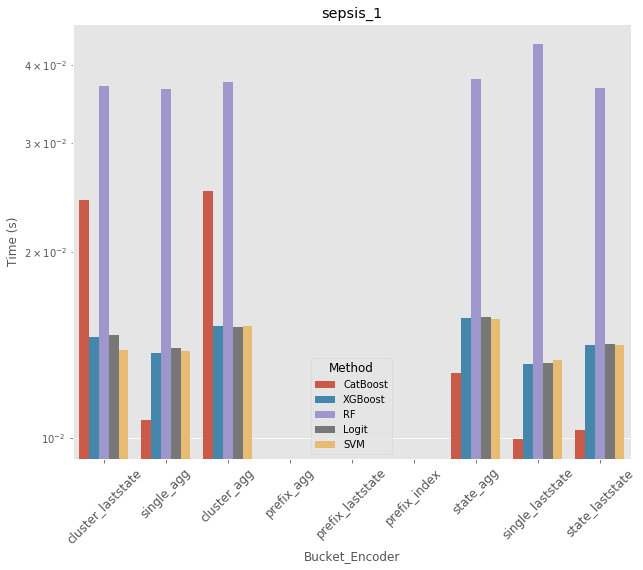

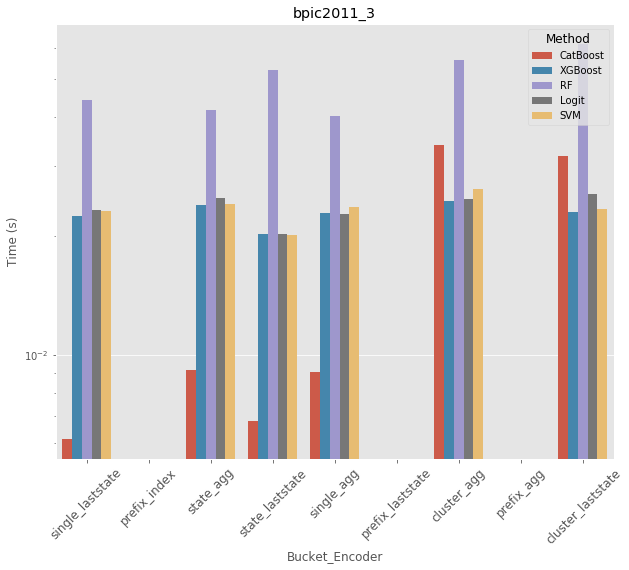

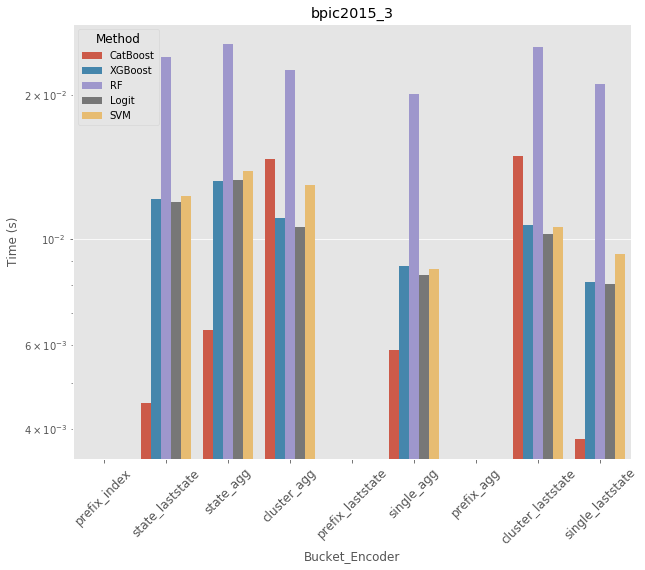

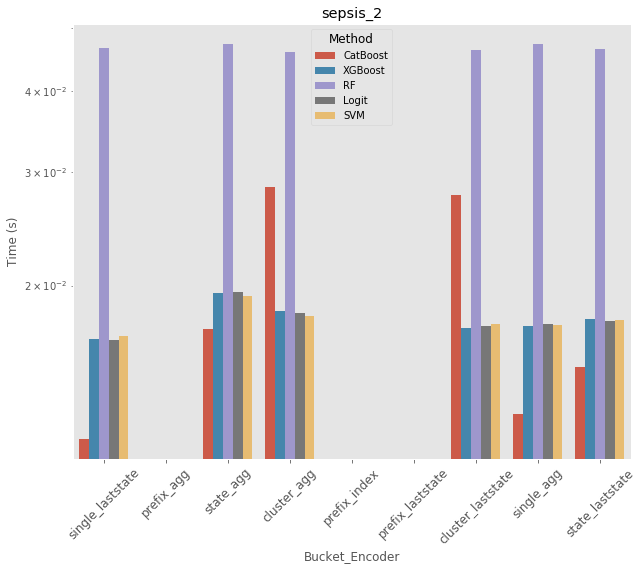

In [207]:
plot_time(df1);